# FT-ICR analysis - PART 3

Created on 16 March 2020 for the Pentatrap experiment

@author: Menno Door<br>
@contact: door+fticr@mpi-k.de<br>
@license: MIT license

### Refenences :
used toolkit of Jonas Karthein for PI-ICR as template :) thank you!

TODO: needed references
PART 1
resonator / dip function
pnp / Apnp
PART 2 
FT-ICR, invarianz theorem
polyfit / cancellation / AICc and stuff
PART 3
statistics

### Introduction

This part of the analysis summarises all the results for some ion ratio to one ratio considering proper(?) statistics. Also it will allow you to calculate some estimates of systematics.

### Requirements:

The following code was written in Python 3.7. The required libraries are listed below with a rough description for their task in the code.

    pandas (data organisation, calculation and visualization)
    numpy (calculation)
    matplotlib (plotting)
    scipy (chi square fitting)
    jupyter (Python notebook environment)
    
### TODO:

 - time filter
 - daytime filter
 - statistics as a function
 - test if ratio between traps and measurements is statistically the same (hypothesis test), also usefull for metastables (test also with different analysis methods)
 - test if dR is normally distributed about the mean dR and compare the single ratio precision and normallity between traps and measurements and anaylsis methods.
 - most likely hood fit of gaussian distribution of the ratio?
 

In [1]:
# standard libs
from datetime import datetime, timedelta
from pathlib import Path
import os, json, re
from pprint import pprint

# math and data
import numpy as np
import math
import scipy
from scipy.stats import norm, moment
import pandas as pd
from uncertainties import ufloat

# visualization
from IPython.core.display import display, HTML
display(HTML("<style>.container { width:90% !important; }</style>"))
display(HTML("<style>div.output_scroll { height: 50em; }</style>"))

import ipywidgets as widgets
from ipywidgets import interact, interact_manual, interactive

%matplotlib inline 

import matplotlib
import matplotlib as mpl
import matplotlib.pyplot as plt
import plotly.graph_objs as go
import plotly.offline as py
import plotly.express as px
import qgrid

py.init_notebook_mode()

plt.rcParams['figure.figsize'] = (11, 8)

%load_ext autoreload
%autoreload 2

# this package
from fticr_toolkit import *
from fticr_toolkit import ideal_trap_physics as itp
from fticr_toolkit import ame
from scipy import constants
amu = constants.physical_constants["atomic mass unit-kilogram relationship"][0]
e = constants.e

pd.options.display.float_format = '{: .13f}'.format

corrected ratio, 1/ratio 1.01140613515+/-0.00000000007 0.98872249757+/-0.00000000007
ioi eV emass, binding 2043995.80000+/-0.00006 87.10+/-0.05
ioi u emass, binding 0.00219431963626+/-0.00000000000006 (9.350+/-0.005)e-08
corrected ratio, 1/ratio 1.03493997319+/-0.00000000008 0.96623961380+/-0.00000000008
ioi eV emass, binding 2043995.80000+/-0.00006 87.10+/-0.05
ioi u emass, binding 0.00219431963626+/-0.00000000000006 (9.350+/-0.005)e-08
corrected ratio, 1/ratio 1.00547994475+/-0.00000000007 0.99454992138+/-0.00000000007
ioi eV emass, binding 2043995.80000+/-0.00006 87.10+/-0.05
ioi u emass, binding 0.00219431963626+/-0.00000000000006 (9.350+/-0.005)e-08
corrected ratio, 1/ratio 1.02289143345+/-0.00000000008 0.97762085720+/-0.00000000007
ioi eV emass, binding 2043995.80000+/-0.00006 87.10+/-0.05
ioi u emass, binding 0.00219431963626+/-0.00000000000006 (9.350+/-0.005)e-08
corrected ratio, 1/ratio 0.99384064089+/-0.00000000007 1.00619753194+/-0.00000000008
ioi eV emass, binding 2043995.8

In [2]:
###   P A R A M E T E R   L I S T   ( this is especially used for batch processing using the papermill package )
input_folder = "Z:\\DATA_for_ANALYSIS\\analysis_Menno\\21_Re_Os_ratio_cancellation"
#input_folder = "E:\\\\local_analysis\\132Xe_208Pb\\"
#input_folder = "E:\\\\local_analysis\\HoDy\\"
#input_folder = "E:\\\\local_analysis\\Yb172176\\"
input_folder = "E:\\\\local_analysis\\Yb172174\\"
input_folder = "G:\\Yb\\172174_var1\\"
#input_folder = "Z:\\DATA_for_ANALYSIS\\analysis_Menno\\21_Re_Os_ratio_cancellation\\"
input_folder = "G:\\Yb\\172176_var\\"
input_folder = "G:\\Yb\\17241+42+_binding_var\\"
input_folder = "G:\\Yb\\17242+43+_binding_var\\"
input_folder = "G:\\Yb\\17241+42+_binding_var_dualPnP\\"
#input_folder = "E:\\\\local_analysis\\Ne\\"
input_folder = "E:\\\\local_analysis\\208Pb_Pb#\\"
input_folder = "G:\\Yb\\172176_var\\"
#input_folder = "G:\\Yb\\172168_var1\\"

split_char = "_"
number_idx = -1

#blocked = [34,37,38,39,45,49]
#blocked = [1,2,4,7,10,11,12,14,15,16,18,19,8] # 170
#blocked = [6]
blocked = [3,7] #Pb metastable
blocked = ["16", "2", "9"] #Neon absolute, 16 because of wierd reference drift in trap3, 2 and 9 because of difference in axial frequencies of the two positions of > 1 Hz
#blocked = ["16"] #Neon absolute, 16 because of wierd reference drift in trap3, 2 and 9 because of difference in axial frequencies of the two positions of > 1 Hz
blocked = [1] #Yb 172170_var
blocked = [1, 6] #Yb 172168_var

output_folder = "summary"
subfolders = []
time_filter = [None, None] # ["20200101_010203", "20201201_010203"] # TODO
daytime_filter = [None, None] # ["1915", "0630"] # TODO

In [3]:
master_folder = Path(input_folder)
subfolders = [x for x in master_folder.iterdir() if x.is_dir() and not str(x.name).startswith("_") and str(x.name)[0].isdigit() and (str(x.name).rsplit(split_char,2)[number_idx]) not in blocked]
#subfolders = [x for x in master_folder.iterdir() if x.is_dir() and not str(x.name).startswith("_") and str(x.name)[0].isdigit()]
os.chdir(master_folder)
pprint(subfolders)

[WindowsPath('G:/Yb/172176_var/176Yb42+_172Yb42+_176Yb42+_var_1'),
 WindowsPath('G:/Yb/172176_var/176Yb42+_172Yb42+_176Yb42+_var_10'),
 WindowsPath('G:/Yb/172176_var/176Yb42+_172Yb42+_176Yb42+_var_11'),
 WindowsPath('G:/Yb/172176_var/176Yb42+_172Yb42+_176Yb42+_var_12'),
 WindowsPath('G:/Yb/172176_var/176Yb42+_172Yb42+_176Yb42+_var_4'),
 WindowsPath('G:/Yb/172176_var/176Yb42+_172Yb42+_176Yb42+_var_6'),
 WindowsPath('G:/Yb/172176_var/176Yb42+_172Yb42+_176Yb42+_var_8')]


### Step 0: Load data & merge

Please supply the parent folder of you measurement folders which contain the results from part 2 (with output folder "results". Keep your data clean, one type of ratio per folder.

All datasets will be merged, the folder name (measurement title) will be given as a column too. All data is in the data - dictionary, but merging an visuallization will be only done for the polyfit and cancellation results.

In [4]:
data = data_conversion.load_data_multi_folder(folderlist=subfolders, input_data='results', measurement_script = "unwrap_n_measure_repeat")
os.chdir(master_folder)

if not os.path.exists(output_folder):
    os.makedirs(output_folder)

G:\Yb\172176_var\176Yb42+_172Yb42+_176Yb42+_var_1

 >>> I hope you are in PART2 or 3, loading pre analysed data from folder... <<< 


 >>> WARNING!!! Flipped ratio for results\step10_polyfit_grouping_best_for_plot.csv but could not flip ion numerator and ion denominator colums! <<< 

G:\Yb\172176_var\176Yb42+_172Yb42+_176Yb42+_var_10

 >>> I hope you are in PART2 or 3, loading pre analysed data from folder... <<< 


 >>> WARNING!!! Flipped ratio for results\step10_polyfit_grouping_best_for_plot.csv but could not flip ion numerator and ion denominator colums! <<< 


 >>> WARNING!!! Flipped ratio for results\step11_cancel_naive_results.csv but could not flip ion numerator and ion denominator colums! <<< 


 >>> WARNING!!! Flipped ratio for results\step11_cancel_naive_results_bc.csv but could not flip ion numerator and ion denominator colums! <<< 


 >>> WARNING!!! Flipped ratio for results\step11_cancel_naive_results_merged.csv but could not flip ion numerator and ion denominator colums!

In [5]:
# merge datasets of same type together and add measurement column

configs = {}
merged = {}
for meas_name, meas_data in data.items():
    #print(meas_name)
    for step_key, step_data in meas_data.items():
        if meas_name == "merged": continue # dont merge the merged stuff ;)
        step_data["measurement"] = meas_name # this adds the measurement title as a column to the data
        
        try:
            if step_key in merged:
                merged[step_key] = merged[step_key].append(step_data, ignore_index=True)
            else:
                if isinstance(step_data, dict):
                    configs[meas_name] = step_data
                merged[step_key] = step_data
        except Exception as e:
            if isinstance(step_data, dict):
                configs[meas_name] = step_data
            else:
                print(meas_name, step_key, e)

data["merged"] = merged
print(data['merged'].keys())
for step, sdata in data['merged'].items():
    try:
        sdata.to_csv(output_folder+"/"+step+'.csv')
    except:
        pass

pprint(configs.keys())

dict_keys(['step10_polyfit', 'step10_polyfit_best', 'step10_polyfit_best_fits', 'step10_polyfit_grouping_best_for_plot', 'step11_cancel_naive_results', 'step11_cancel_naive_results_bc', 'step11_cancel_naive_results_merged', 'step11_trap_ratio_data', 'step12_cancel_interpol_results', 'step13_cancel_polyfit', 'step13_cancel_polyfit_best', 'step13_cancel_polyfit_best_fits', 'step3_unwrap_p_phases', 'step4_nu_p_N', 'step5_all_freqs_values', 'step5_nu_p_values', 'step6_nu_c', 'step7_first_filter', 'step8_naive_results', 'step8_naive_results_bc', 'step8_naive_results_merged', 'step9b_interpolate_results', 'step9_interpolate_results', 'measurement_config'])
dict_keys(['176Yb42+_172Yb42+_176Yb42+_var_1', '176Yb42+_172Yb42+_176Yb42+_var_10', '176Yb42+_172Yb42+_176Yb42+_var_11', '176Yb42+_172Yb42+_176Yb42+_var_12', '176Yb42+_172Yb42+_176Yb42+_var_4', '176Yb42+_172Yb42+_176Yb42+_var_6', '176Yb42+_172Yb42+_176Yb42+_var_8'])


## check trap voltage diffs

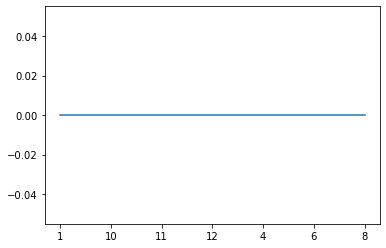

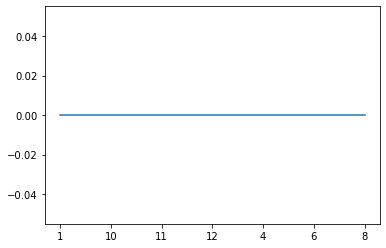

In [6]:
t2 = []
t3 = []
midx = []
for measurement, conf in configs.items():
    midx.append(measurement.split("_")[-1])
    #print(conf)
    Up1t2 = conf['position_1']['traps'][2]["U0"]
    Up1t3 = conf['position_1']['traps'][3]["U0"]
    Up2t2 = conf['position_2']['traps'][2]["U0"]
    Up2t3 = conf['position_2']['traps'][3]["U0"]
    diff = Up1t2 - Up2t2
    if diff < 0:
        diff *= -1
    t2.append(diff)
    diff = Up1t3 - Up2t3
    if diff < 0:
        diff *= -1
    t3.append(diff)
    
plt.plot(midx, t2)
plt.show()

plt.plot(midx, t3)

### Step 11.b: Check data

Plot a few values 

In [7]:
pprint(data['merged'].keys())
#print(data['merged']["step7_first_filter"].keys())
step7_first_filter = data['merged']["step7_first_filter"]
subset = step7_first_filter[ step7_first_filter['masked'] == False ]

fig = px.scatter(subset, x="time_p", y="nu_c", error_y="dnu_c", facet_col="trap", facet_row="position", color="position", hover_data=["measurement", "mcycle", "cycle", "position", "ion"]) #, facet_row="position"
fig.update_yaxes(matches=None, showticklabels=True)
fig.update_layout(yaxis=dict(scaleanchor='x'))
fig.update_layout(yaxis2=dict(scaleanchor='x2'))
fig.show()

dict_keys(['step10_polyfit', 'step10_polyfit_best', 'step10_polyfit_best_fits', 'step10_polyfit_grouping_best_for_plot', 'step11_cancel_naive_results', 'step11_cancel_naive_results_bc', 'step11_cancel_naive_results_merged', 'step11_trap_ratio_data', 'step12_cancel_interpol_results', 'step13_cancel_polyfit', 'step13_cancel_polyfit_best', 'step13_cancel_polyfit_best_fits', 'step3_unwrap_p_phases', 'step4_nu_p_N', 'step5_all_freqs_values', 'step5_nu_p_values', 'step6_nu_c', 'step7_first_filter', 'step8_naive_results', 'step8_naive_results_bc', 'step8_naive_results_merged', 'step9b_interpolate_results', 'step9_interpolate_results', 'measurement_config'])


['172Yb42+' '176Yb42+']


trap, ion, mean off_res, errin, errout (2, '172Yb42+') -1.1040137703624169 0.021895511826516594 0.05632943351673561
trap, ion, mean off_res, errin, errout (2, '176Yb42+') 0.2676370361494944 0.02115082155513517 0.05411995506576729
trap, ion, mean off_res, errin, errout (3, '172Yb42+') -1.3543158586795558 0.01634281235946534 0.06714739783317031
trap, ion, mean off_res, errin, errout (3, '176Yb42+') -1.6048089218791162 0.014068053635158175 0.042606291086328005
('176Yb42+_172Yb42+_176Yb42+_var_1', 2) dnup impact 302024466603 uHz
('176Yb42+_172Yb42+_176Yb42+_var_1', 2) dnuz impact 110809940 uHz
('176Yb42+_172Yb42+_176Yb42+_var_1', 3) dnup impact 302231027774 uHz
('176Yb42+_172Yb42+_176Yb42+_var_1', 3) dnuz impact 50646399 uHz
('176Yb42+_172Yb42+_176Yb42+_var_10', 2) dnup impact 300993118485 uHz
('176Yb42+_172Yb42+_176Yb42+_var_10', 2) dnuz impact 110403781 uHz
('176Yb42+_172Yb42+_176Yb42+_var_10', 3) dnup impact 300636111045 uHz
('176Yb42+_172Yb42+_176Yb42+_var_10', 3) dnuz impact 50382121 

E:\git_repositories\ControlSystem3\repositories\ft-icr_toolkit\fticr_toolkit\visualization.py:798: UserWarning:

Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.

c:\program files\python37\lib\site-packages\ipykernel_launcher.py:143: UserWarning:

Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.

findfont: Font family ['cursive'] not found. Falling back to DejaVu Sans.
findfont: Font family ['Bitstream Vera Sans'] not found. Falling back to DejaVu Sans.
findfont: Font family ['Bitstream Vera Sans'] not found. Falling back to DejaVu Sans.
findfont: Font family ['Bitstream Vera Sans'] not found. Falling back to DejaVu Sans.


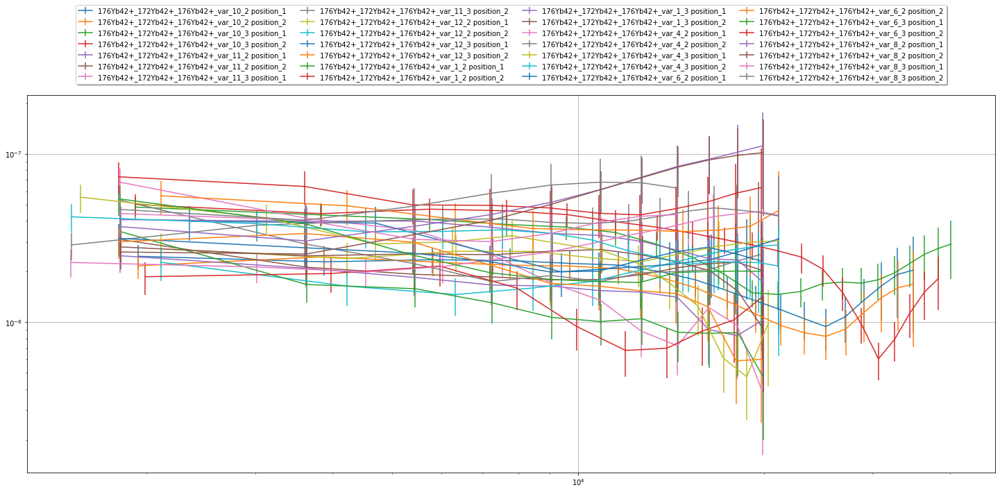

In [8]:
new_df = pd.DataFrame()

for name, grp in step7_first_filter.groupby(["measurement", "trap"]):
    sub = filtering.three_sigma(grp, "nu_z", err=None, times_sigma=3, undrift_xcolumn=None, manual_std=None, show=False)                      
    #nu_res, dnu_res = statistics.mean_and_error(sub['nu_res'], sub['dnu_res'])
    #sub['diffnuzres'] = nu_res - sub['nu_z']
    #sub['ddiffnuzres'] = (sub['dnu_z']**2 + dnu_res**2).apply(np.sqrt)
    new_df = new_df.append(sub)


step7_first_filter = new_df
step7_first_filter_unmasked = step7_first_filter[ step7_first_filter["masked"]==False ]

#step7_first_filter_unmasked['diffnuzres'] = step7_first_filter_unmasked['nu_res'] - step7_first_filter_unmasked['nu_z']
#step7_first_filter_unmasked['ddiffnuzres'] = np.sqrt( step7_first_filter_unmasked['nu_res']**2 - step7_first_filter_unmasked['nu_z']**2 )

fig = px.scatter(step7_first_filter_unmasked, x="time", y="nu_z", error_y="dnu_z", facet_col="trap", facet_row="position", hover_data=["measurement", "cycle"], color="measurement")
fig.update_yaxes(matches=None, showticklabels=True)
fig.show()

ions = step7_first_filter_unmasked.ion.unique()
print(ions)
mion1, dmion1, mdata = ame.get_ion_mass(ion=ions[0], binding=None, full=True, show=False, debug = False)
mion1 = ufloat(mion1, dmion1)
q1 = mdata['q']
mion2, dmion2, mdata = ame.get_ion_mass(ion=ions[1], binding=None, full=True, show=False, debug = False)
mion2 = ufloat(mion2, dmion2)
q2 = mdata['q']
factor = q2/q1*mion1/mion2

if False:
    for trap, tgrp in step7_first_filter_unmasked.groupby(["trap"]):

        print("nuz diffs per measurements in trap", trap)
        measures = []
        diffs = []
        ddiffs = []
        ratios = []
        dratios = []
        upatches = []
        dupatches = []
        for meas, measgrp in tgrp.groupby(["measurement"]):
            pos1 = measgrp[measgrp.ion == ions[0]]
            pos2 = measgrp[measgrp.ion == ions[1]]
            pos1name = pos1.position.unique()[0]
            pos2name = pos2.position.unique()[0]

            mean_nuz1, err_in1, err_out1, chi2red1 = statistics.complete_mean_and_error(pos1.nu_z, pos1.dnu_z, student=False)
            mean_nuz2, err_in2, err_out2, chi2red2 = statistics.complete_mean_and_error(pos2.nu_z, pos2.dnu_z, student=False)
            diff = mean_nuz1 - mean_nuz2
            ddiff = np.sqrt(max([err_in1, err_out1])**2 + max([err_in2, err_out2])**2 )
            ratio = mean_nuz1 / mean_nuz2
            dratio = ratio * np.sqrt((max([err_in1, err_out1])/mean_nuz1)**2 + (max([err_in2, err_out2])/mean_nuz2)**2 )
            uratio = ufloat(ratio, dratio)
            print(meas, diff, ddiff)
            measures.append(meas)
            diffs.append(diff)
            ddiffs.append(ddiff)
            ratios.append(ratio)
            dratios.append(dratio)
            U1 = configs[meas][pos1name]['traps'][int(trap)]["U0"]
            U2 = configs[meas][pos2name]['traps'][int(trap)]["U0"]
            upatch = (U1-U2*uratio**2*factor)/(uratio**2*factor - 1)
            upatches.append(upatch.n)
            dupatches.append(upatch.s)


        mean_diff, err_in, err_out, chi2red = statistics.complete_mean_and_error(diffs, ddiffs, student=False)
        print("mean nu_z_diff in trap", trap, mean_diff, err_in, err_out)
        mean_ratio, err_in, err_out, chi2red = statistics.complete_mean_and_error(ratios, dratios, student=False)
        print("mean nu_z_ratio in trap", trap, mean_ratio, err_in, err_out)
        mean_upatch, err_in, err_out, chi2red = statistics.complete_mean_and_error(upatches, dupatches, student=False)
        print("mean U patch in trap", trap, mean_upatch, err_in, err_out)


fig = px.scatter(step7_first_filter_unmasked, x="time", y="nu_z", error_y="dnu_z", facet_col="trap", facet_row="ion", hover_data=["measurement", "cycle"], color="measurement")
fig.update_yaxes(matches=None, showticklabels=True)
fig.show()

fig = px.scatter(step7_first_filter_unmasked, x="time", y="dip_width", error_y="ddip_width", facet_col="trap", facet_row="ion", hover_data=["measurement", "cycle"], color="measurement")
fig.update_yaxes(matches=None, showticklabels=True)
fig.show()


fig = px.scatter(step7_first_filter_unmasked, x="time", y="dnu_z", facet_col="trap", facet_row="position", hover_data=["cycle"], color="measurement")
fig.update_yaxes(matches=None, showticklabels=True)
fig.show()

try:
    fig = px.scatter(step7_first_filter_unmasked, x="time", y="nu_res", error_y="dnu_res", facet_col="trap", facet_row="ion", hover_data=["measurement", "cycle"], color="measurement")
    fig.update_yaxes(matches=None, showticklabels=True)
    fig.show()

    fig = px.scatter(step7_first_filter_unmasked, x="nu_res", error_x="dnu_res", y="Q", error_y="dQ", facet_col="trap", color="ion", hover_data=["measurement", "cycle"])
    fig.update_yaxes(matches=None, showticklabels=True)
    fig.update_xaxes(matches=None, showticklabels=True)
    fig.show()
except:
    pass

try:
    step7_first_filter_unmasked["offnu_res"] = step7_first_filter_unmasked["nu_z"] - step7_first_filter_unmasked["nu_res"]
    step7_first_filter_unmasked["doffnu_res"] = np.sqrt(step7_first_filter_unmasked["dnu_z"].to_numpy()**2 + step7_first_filter_unmasked["dnu_res"].to_numpy()**2)
    fig = px.scatter(step7_first_filter_unmasked, x="time", y="offnu_res", error_y="doffnu_res", facet_col="trap", facet_row='ion', hover_data=['mcycle', 'cycle', 'position'])
    fig.update_yaxes(matches=None, showticklabels=True)
    fig.show()
    
    for grpname, grp in step7_first_filter_unmasked.groupby(["trap", "ion"]):
        vals = grp["offnu_res"]
        dvals = grp["doffnu_res"]
        mean_off_res, err_in, err_out, chi2red = statistics.complete_mean_and_error(vals, dvals)
        print("trap, ion, mean off_res, errin, errout", grpname, mean_off_res, err_in, err_out)

except:
    pass

#fig = px.scatter(step7_first_filter_unmasked, x="time", y="diffnuzres", error_y="ddiffnuzres", facet_col="trap", facet_row="position", hover_data=["cycle"], color="measurement")
#fig.update_yaxes(matches=None, showticklabels=True)
#fig.show()

#""" ALLAPLOTS
df_dict = {} # tag, data
inner = False
for grpname, grpdata in step7_first_filter_unmasked.groupby(["measurement", "trap"]):
    if inner:
        print(grpname, "dnup impact", int(grpdata.nu_p.mean()/grpdata.nu_c.mean()*grpdata.dnu_p.mean()*1e6), "uHz")
        #print(grpname, "dnup", int(grpdata.dnu_p.mean()*1e6), "uHz")
        print(grpname, "dnuz impact",  int(grpdata.nu_z.mean()/grpdata.nu_c.mean()*grpdata.dnu_z.mean()*1e6), "uHz")
        #print(grpname, "dnuz",  int(grpdata.dnu_z.mean()*1e3), "mHz")
        tag = grpname[0]+"_"+str(grpname[1])
        df_dict[tag] = grpdata
        
    else:
        print(grpname, "dnup impact", int(grpdata.nu_p.mean()/grpdata.nu_c.mean()*grpdata.nu_p.std()*1e6), "uHz")
        #print(grpname, "dnup", int(grpdata.dnu_p.mean()*1e6), "uHz")
        print(grpname, "dnuz impact",  int(grpdata.nu_z.mean()/grpdata.nu_c.mean()*grpdata.nu_z.std()*1e6), "uHz")
        #print(grpname, "dnuz",  int(grpdata.dnu_z.mean()*1e3), "mHz")
        tag = grpname[0]+"_"+str(grpname[1])
        df_dict[tag] = grpdata
        
print("nuz allan compare")
fig = visualization.allancompare(df_dict, time='time', ycol='nu_z', normalize=True, groupby=['position'])
fig.show()


c:\program files\python37\lib\site-packages\ipykernel_launcher.py:21: UserWarning:

Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.



(2, '172Yb42+') 26269541.57097485
(2, '176Yb42+') 25671309.533567876
(3, '172Yb42+') 26269568.131853133
(3, '176Yb42+') 25671335.481368203
172Yb42+ 176Yb42+
16680569


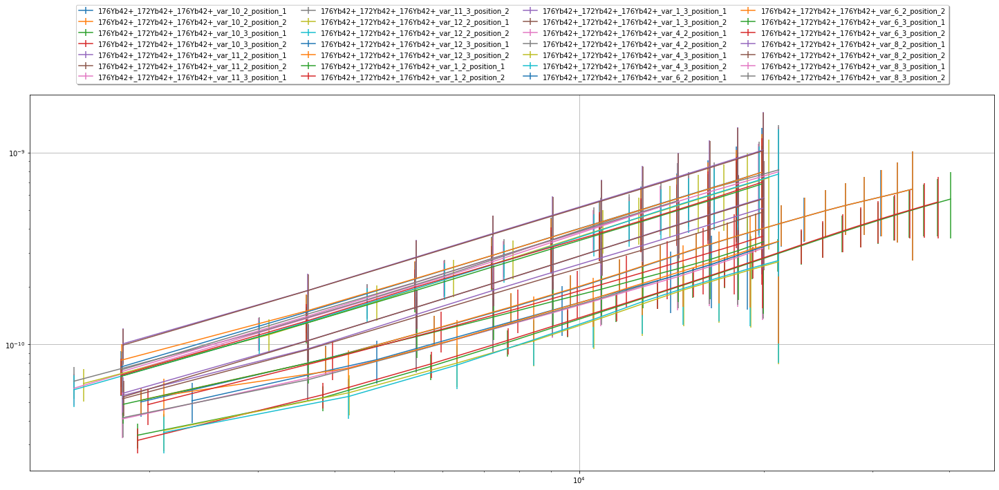

In [9]:
fig = px.scatter(step7_first_filter, x="time", y="phase_p", error_y="dphase_p", facet_col="trap", facet_row="position", hover_data=["measurement", "cycle"], color="measurement")
fig.update_yaxes(matches=None, showticklabels=True)
fig.show()
step7_first_filter.to_csv(Path(master_folder, "step7_all_data.csv"))

fig = px.scatter(step7_first_filter, x="time", y="nu_p", error_y="dnu_p", facet_row="position", facet_col="trap", hover_data=["measurement", "cycle"])
#fig = px.scatter(step7_first_filter, x="time", y="nu_p", error_y="dnu_p", facet_col="trap", hover_data=["measurement", "cycle"])
fig.update_yaxes(matches=None, showticklabels=True)
fig.show()

fig = px.scatter(step7_first_filter_unmasked, x="time", y="nu_p", error_y="dnu_p", facet_row="ion", facet_col="trap", hover_data=["measurement", "cycle"], color="ion")
fig.update_yaxes(matches=None, showticklabels=True)
fig.show()


df_dict = {} # tag, data
for grpname, grpdata in step7_first_filter_unmasked.groupby(["measurement", "trap", "position"]):
    tag = grpname[0]+"_"+str(grpname[1])+"_"+str(grpname[2])
    df_dict[tag] = grpdata
fig = visualization.allancompare(df_dict, time='time', ycol='nu_p', normalize=True)
fig.show()

fig = px.scatter(step7_first_filter_unmasked, x="time", y="nu_c", error_y="dnu_c", facet_row="position", facet_col="trap", hover_data=["measurement", "cycle"], color="position")
fig.update_yaxes(matches=None, showticklabels=True)
fig.show()
step7_first_filter_unmasked.to_csv(Path(master_folder, "step7_all_data_unmasked.csv"))

fig = px.scatter(step7_first_filter_unmasked, x="time", y="nu_c", error_y="dnu_c", facet_row="ion", facet_col="trap", hover_data=["measurement", "cycle", "mcycle"], color="ion")
fig.update_yaxes(matches=None, showticklabels=True)
fig.show()

for grpname, grpdata in step7_first_filter_unmasked.groupby(["trap", "ion"]):
    print(grpname, grpdata.nu_c.mean())

try:
    ions = list(step7_first_filter_unmasked.ion.unique())
    ionA = ions[0]
    ionB = ions[1]
    print(ionA, ionB)
except:
    pass

step7_first_filter_unmasked['time'] = step7_first_filter_unmasked['time'].round('1s')
step7_first_filter_unmasked['time_p'] = pd.to_datetime(step7_first_filter_unmasked['time_p'])
step7_first_filter_unmasked['time_p'] = step7_first_filter_unmasked['time_p'].round('1s')
min_nu_c = int(step7_first_filter_unmasked.nu_c.min())
min_nu_c = 16680543 + 26
min_t = step7_first_filter_unmasked.epoch_p.min()

step7_first_filter_unmasked["nu_c_min"] = min_nu_c
step7_first_filter_unmasked["nu_c_d"] = step7_first_filter_unmasked["nu_c"] - min_nu_c
step7_first_filter_unmasked["nu_c_d_mhz"] = step7_first_filter_unmasked["nu_c_d"] * 1000
step7_first_filter_unmasked["dnu_c_mhz"] = step7_first_filter_unmasked["dnu_c"] * 1000
step7_first_filter_unmasked["seconds"] = step7_first_filter_unmasked["epoch_p"] - min_t
step7_first_filter_unmasked["minutes"] = step7_first_filter_unmasked["seconds"] / 60
step7_first_filter_unmasked["hours"] = step7_first_filter_unmasked["minutes"] / 60
print(min_nu_c)
for grpname, grp in step7_first_filter_unmasked.groupby(["trap", "ion"]):
    grp.to_csv(Path(master_folder, "step7_first_filter_t"+str(grpname[0])+"_"+str(grpname[1])+".txt"), sep="\t", index=False)
    sub = grp[(grp['mcycle']==1) & (grp['cycle']<10)]
    sub.to_csv(Path(master_folder, "step7_first_filter_t"+str(grpname[0])+"_"+str(grpname[1])+"_sc1-10.txt"), sep="\t", index=False)
    #display(sub)

No handles with labels found to put in legend.
E:\git_repositories\ControlSystem3\repositories\ft-icr_toolkit\fticr_toolkit\visualization.py:798: UserWarning:

Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.

c:\program files\python37\lib\site-packages\ipykernel_launcher.py:56: UserWarning:

Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.



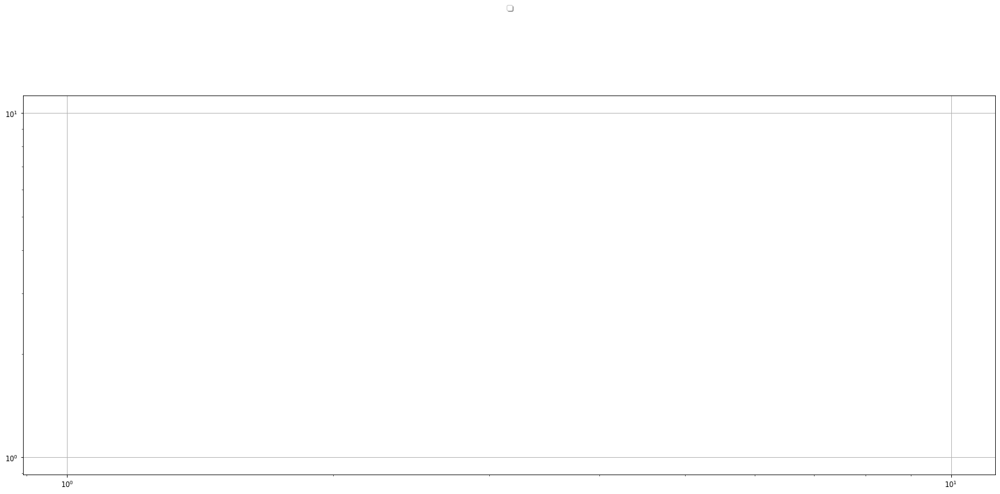

In [10]:
### step7_Bratio_for_paper_plot

step7_first_filter.sort_values(by=["time"], inplace=True)
times=[]
ratio=[]
drati=[]
traps=[]
posit=[]
measu=[]
ionra=[]
for grpname, grp in step7_first_filter.groupby("time"):
    grp.sort_values(by="trap", inplace=True)
    try:
        Br = grp["nu_c"].iloc[1]/grp["nu_c"].iloc[0]
        dBr = Br * np.sqrt( (grp["dnu_c"].iloc[0]/grp["nu_c"].iloc[0])**2 + (grp["dnu_c"].iloc[1]/grp["nu_c"].iloc[1])**2 ) 
    except:
        continue
    if (grp["masked"].iloc[0] or grp["masked"].iloc[1] ):
        print("masked...", grpname)
        continue
    if (grp["position"].iloc[0] != grp["position"].iloc[1]):
        print("mixed position...", grp["position"].to_numpy())
        continue
    times.append(grp["time"].iloc[0])
    trapstr = str(grp["trap"].iloc[1]) + "/" + str(grp["trap"].iloc[0])
    traps.append(trapstr)
    trapstr = str(grp["ion"].iloc[1]) + "/" + str(grp["ion"].iloc[0])
    ionra.append(trapstr)
    ratio.append(Br)
    drati.append(dBr)
    posit.append(grp["position"].iloc[0])
    measu.append(grp["measurement"].iloc[0])
    
#step10_polyfit_best_fits
    
df = pd.DataFrame(data={"time": times, "R": ratio, "dR": drati, "traps": traps, "ions": ionra, "position": posit, "measurement": measu})
df["nu_c_trap_ratio_-1"] = df["R"] - 1
#display(df)
fig = px.scatter(df, x="time", y="nu_c_trap_ratio_-1", error_y="dR", hover_data=["traps", "ions", "position"])
#fig = px.scatter(x=times[:-2], y=df["Rminus"][:-2], error_y=drati[:-2])
fig.show()

df["epoch"] = df["time"].astype('int64')//1e9
df["seconds"] = df["epoch"] - df["epoch"].min()
df["minutes"] = df["seconds"] / 60
df["hours"] = df["minutes"] / 60

df.to_csv(Path(master_folder, "step7_Bratio_for_paper_plot.csv"))
df.to_csv(Path(master_folder, "step7_Bratio_for_paper_plot.txt"), sep="\t")

df_dict = {} # tag, data
for grpname, grpdata in df.groupby(["measurement", "position"]):
    tag = grpname[0]+"_"+str(grpname[1])
    df_dict[tag] = grpdata
fig = visualization.allancompare(df_dict, time='time', ycol='R')
fig.show()


trap 2


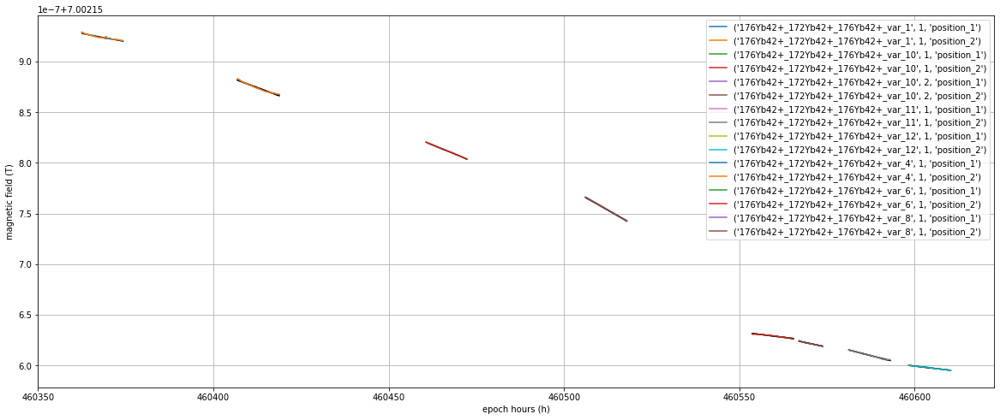

trap 3


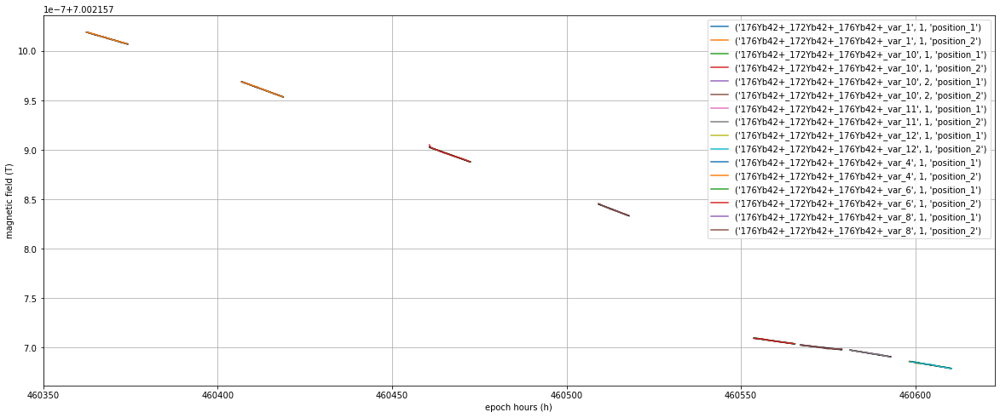

In [11]:
### Bdrift fit
amu = constants.physical_constants["atomic mass unit-kilogram relationship"][0]
e = constants.e

step7_first_filter.sort_values(by=["time"], inplace=True)
plt.rcParams['figure.figsize'] = (20, 8)

columns = ["trap", "measurement", "mcycle", "position", "dBds", "dBdh", "epoch", "epochhour", "ion"]
drift_data = pd.DataFrame(columns=columns)

for trap, tdata in step7_first_filter.groupby("trap"):
    print("trap", trap)
    
    for grpname, grp in tdata.groupby(["measurement", "mcycle", "position"]):
        grp.sort_values(by="time", inplace=True)

        ion = grp.ion.unique()[0]
        #print(ion)
        A, el, q = itp.re_ionstr(ion=ion)
        m = ame.get_ion_mass(ion=ion)[0]

        B = grp["nu_c"].to_numpy()*2*np.pi*m/q*amu/e
        try:
            t = grp["epoch"].to_numpy()
        except KeyError:
            t = grp["time"].astype('int64')//1e9
            #print(trap, grpname, t)


        #print(np.mean(B))
        
        # fit
        try:
            coeff = np.polyfit(t, B, 1)
            dBds = coeff[0]
        except:
            continue
        
        sdata = [trap]
        sdata.extend(grpname)
        sdata.extend([dBds])
        sdata.extend([dBds*3600])
        sdata.extend([np.mean(t)])
        sdata.extend([np.mean(t)/3600])
        sdata.extend([str(ion)])
        series = pd.Series(sdata, index=columns)
        drift_data = drift_data.append(series, ignore_index=True)
        
        plt.plot(t/3600, np.polyval(coeff, t), c='k')
        plt.plot(t/3600, B, label=grpname)

    plt.xlabel("epoch hours (h)")
    plt.ylabel("magnetic field (T)")
    plt.legend()
    plt.grid()
    plt.show()

#fig = px.scatter(drift_data, x="epoch", y="dBds", color="trap", hover_data=["measurement", "mcycle", "trap"])
fig = px.scatter(drift_data, x="epochhour", y="dBdh", color="trap", hover_data=["measurement", "mcycle", "trap", "ion", "position"])
fig.show()

### Check results by method

In [12]:
# fix poly
print(data)
crit = 'AICc'
step10_polyfit_best_fits2 = pd.DataFrame()
for grpname, grp in data['merged']['step10_polyfit_best_fits'].groupby(["measurement", "mcycle", "trap", "groupsize", "group"]):
    mincrit = grp[crit].min()
    sub = grp[ grp[crit]==mincrit ]
    step10_polyfit_best_fits2 = step10_polyfit_best_fits2.append(sub, ignore_index=True)

data['merged']['step10_polyfit_best_fits2'] = step10_polyfit_best_fits2

step10_polyfit_best_fits3 = pd.DataFrame()
sub = statistics.average_subsets(data['merged']['step10_polyfit_best_fits2'], groupby=["measurement", "mcycle", "trap"], errortype="stderror", columns=["R", "Rminus"], dcolumns=[None, None], masked=True)
step10_polyfit_best_fits3 = step10_polyfit_best_fits3.append(sub, ignore_index=True)
    
display(step10_polyfit_best_fits3)

{'176Yb42+_172Yb42+_176Yb42+_var_1': {'step10_polyfit':                    AIC               AICc                BIC                R  \
0    -62.8755886334629  -50.8755886334629  -74.2508670411470  1.0233035266741   
1    -62.5676620445724  -50.5676620445724  -73.9429404522566  1.0233035267116   
2    -62.6484168151650  -50.6484168151650  -74.0236952228492  1.0233035267002   
3    -62.5597125310120  -50.5597125310120  -73.9349909386962  1.0233035266850   
4    -51.9628895850161  -27.9628895850161  -61.1817654098844  1.0233035267229   
..                 ...                ...                ...              ...   
409 -435.9592100613288 -433.9104295735239 -610.5496525194601  1.0233035267023   
410 -244.4135644642895 -241.6135644642895 -417.1328059115129  1.0233035266204   
411 -542.0848843968884 -538.3925767045806 -712.9329248332040  1.0233035267011   
412 -432.1578315493603 -427.4209894440971 -601.1346709747680  1.0233035267000   
413 -537.8355973997136 -531.8896514537677 -704.941235

,AIC,AICc,BIC,R,Rminus,c0,c1,c2,c3,c4,...,degree,group,groupsize,ion_denom,ion_numer,masked,mcycle,measurement,time_p,trap
0,-528.0599069888877,-524.1680150969959,-689.5482800554735,1.0233035267043,0.0233035267043,25671310.2275629416108,-0.0000017837438,0.0000000001039,-0.0000000000000,0.0000000000000,...,6.0000000000000,1.0000000000000,0.0000000000000,172Yb42+,172Yb42+,0.0000000000000,1.0000000000000,176Yb42+_172Yb42+_176Yb42+_var_1,2022-07-09 00:17:18.815217152,2.0000000000000
1,-540.6162071271692,-540.0707525817147,-720.8202526180244,1.0233035267008,0.0233035267008,26269568.8908528909087,-0.0000010657047,NaN,NaN,NaN,...,1.0000000000000,1.0000000000000,0.0000000000000,172Yb42+,172Yb42+,0.0000000000000,1.0000000000000,176Yb42+_172Yb42+_176Yb42+_var_1,2022-07-09 00:21:35.575000064,3.0000000000000
2,1467.4114282179723,1467.6780948846390,1285.3361817162092,1.0233035264950,0.0233035264950,25835421.1829398162663,3.3676456718354,NaN,NaN,NaN,...,1.0000000000000,1.0000000000000,0.0000000000000,176Yb42+,176Yb42+,0.0000000000000,1.0000000000000,176Yb42+_172Yb42+_176Yb42+_var_10,2022-07-16 23:37:48.354166784,2.0000000000000
3,1435.3869476751704,1435.6596749478977,1258.1303055982178,1.0233035265044,0.0233035265044,26012007.7112293057144,-1.8195899692707,NaN,NaN,NaN,...,1.0000000000000,1.0000000000000,0.0000000000000,176Yb42+,176Yb42+,0.0000000000000,1.0000000000000,176Yb42+_172Yb42+_176Yb42+_var_10,2022-07-16 23:45:20.941489408,3.0000000000000
4,842.1375462917438,842.6175462917438,751.5002290271884,1.0233035264950,0.0233035264950,25921210.5875673480332,2.9780002931984,NaN,NaN,NaN,...,1.0000000000000,1.0000000000000,0.0000000000000,176Yb42+,176Yb42+,0.0000000000000,2.0000000000000,176Yb42+_172Yb42+_176Yb42+_var_10,2022-07-17 10:29:16.671428352,2.0000000000000
5,1467.1494548970777,1467.4161215637444,1285.0742083953146,1.0233035265044,0.0233035265044,25998773.4065536744893,0.9976850690415,NaN,NaN,NaN,...,1.0000000000000,1.0000000000000,0.0000000000000,176Yb42+,176Yb42+,0.0000000000000,2.0000000000000,176Yb42+_172Yb42+_176Yb42+_var_10,2022-07-17 13:01:22.800000256,3.0000000000000
6,-515.1493826100378,-512.3493826100379,-687.8686240572613,1.0233035267063,0.0233035267063,26269541.1133778393269,-0.0000003435284,-0.0000000001118,0.0000000000000,-0.0000000000000,...,5.0000000000000,1.0000000000000,0.0000000000000,176Yb42+,172Yb42+,0.0000000000000,1.0000000000000,176Yb42+_172Yb42+_176Yb42+_var_11,2022-07-18 03:11:57.841666816,2.0000000000000
7,-515.9599156617060,-511.2230735564428,-684.9367550871136,1.0233035267134,0.0233035267134,25671335.0423537194729,-0.0000004380564,-0.0000000000922,0.0000000000000,-0.0000000000000,...,7.0000000000000,1.0000000000000,0.0000000000000,176Yb42+,172Yb42+,0.0000000000000,1.0000000000000,176Yb42+_172Yb42+_176Yb42+_var_11,2022-07-18 03:11:58.329166592,3.0000000000000
8,-504.5960566633077,-502.1960566633077,-651.1521629215090,1.0233035267081,0.0233035267081,25968702.4387208074331,-0.0000010247710,0.0000000001080,-0.0000000000000,0.0000000000000,...,5.0000000000000,1.0000000000000,0.0000000000000,176Yb42+,172Yb42+,0.0000000000000,1.0000000000000,176Yb42+_172Yb42+_176Yb42+_var_12,2022-07-18 20:21:46.047619072,2.0000000000000
9,-415.3460495131235,-411.8460495131235,-551.0790714988834,1.0233035267186,0.0233035267186,25968728.7159331478179,0.0000008490121,-0.0000000002914,0.0000000000000,-0.0000000000000,...,6.0000000000000,1.0000000000000,0.0000000000000,176Yb42+,172Yb42+,0.0000000000000,1.0000000000000,176Yb42+_172Yb42+_176Yb42+_var_12,2022-07-18 20:31:00.504999936,3.0000000000000


10
step10_polyfit_best
ion_num ['172Yb42+' '176Yb42+']
ion_denom ['172Yb42+' '176Yb42+']
0      176Yb42+_172Yb42+_176Yb42+_var_1
1      176Yb42+_172Yb42+_176Yb42+_var_1
2     176Yb42+_172Yb42+_176Yb42+_var_10
3     176Yb42+_172Yb42+_176Yb42+_var_10
4     176Yb42+_172Yb42+_176Yb42+_var_10
5     176Yb42+_172Yb42+_176Yb42+_var_10
6     176Yb42+_172Yb42+_176Yb42+_var_10
7     176Yb42+_172Yb42+_176Yb42+_var_10
8     176Yb42+_172Yb42+_176Yb42+_var_10
9     176Yb42+_172Yb42+_176Yb42+_var_10
10    176Yb42+_172Yb42+_176Yb42+_var_10
11    176Yb42+_172Yb42+_176Yb42+_var_10
12    176Yb42+_172Yb42+_176Yb42+_var_10
13    176Yb42+_172Yb42+_176Yb42+_var_10
14    176Yb42+_172Yb42+_176Yb42+_var_10
15    176Yb42+_172Yb42+_176Yb42+_var_10
16    176Yb42+_172Yb42+_176Yb42+_var_10
17    176Yb42+_172Yb42+_176Yb42+_var_10
18    176Yb42+_172Yb42+_176Yb42+_var_10
19    176Yb42+_172Yb42+_176Yb42+_var_10
20    176Yb42+_172Yb42+_176Yb42+_var_10
21    176Yb42+_172Yb42+_176Yb42+_var_10
22    176Yb42+_172Yb42+_176Yb42

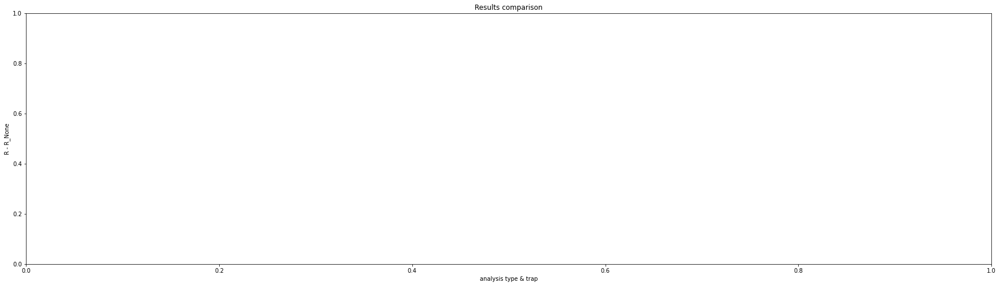

ValueError: Value of 'x' is not the name of a column in 'data_frame'. Expected one of [] but received: time

In [26]:
method_results = {}

for name, dset in sorted(data['merged'].items()):
    if not "R" in dset:
        continue
    
    if name.endswith("fit") or name.endswith("fits") or name.endswith("fits2") or name.endswith("naive_results") or name.endswith("step12_interpol_results") or name.endswith("step10_polycancel") or name.endswith("mgd") or name.endswith("_bc"):
        continue
        
    if "naive" in name:
        continue
        
    num, suffix = name.split("_", 1)
    num = re.findall(r'\d+', str(num))[0]
    print(num)
    fixed_name = 'step'+'{0:0=2d}'.format(int(num))+'_'+suffix
    if ("cancellation_mgd" in fixed_name):
        continue
    print(fixed_name)
    
    #df = filtering.ratio_filter(dset, column="R", dcolumn="dR", minmax=[1.000043599, 1.1])
    #df = filtering.ratio_filter(dset, column="R", dcolumn="dR", minmax=[1.0, 1.1])
    #df = filtering.ratio_filter(dset, column="R", dcolumn="dR", minmax=[0.9, 1.1])
    df = dset
    #meanR = dset.R.mean()
    #df = filtering.ratio_filter(dset, column="R", dcolumn="dR", minmax=[meanR-5e-8, meanR+5e-8])    
    method_results[fixed_name] = df[df["masked"] == False]

    try:
        print("ion_num", dset.ion_numer.unique())
        print("ion_denom", dset.ion_denom.unique())
        print(df.measurement)
    except:
        print('cancel')

        
#data["merged"].pop("step8_2_polyfit")
#ata["merged"].pop("step8_1_polyfit")
#one = method_results[list(method_results.keys())[0]].copy(deep=True)
#one.R = 1
#one.dR = 1e-12
#method_results["one"] = one
visualization.compare(method_results, timecol='time', sort=True, groupby=None, hover_data=None)

In [27]:
method = "step09_interpolate_results"
#display(method_results[method])
fig1 = visualization.ratio_filter_plot(method_results[method], title=method)
fig1.show()

step09_interpolate_results	 1-R = -2.330352670618e-02 +- 1.389e-12 (inner) +- 1.253e-12 (outer), chi2red 0.81


In [28]:
method = "step09_interpolate_results"
df = method_results[method]
Rmean = df.R.mean()

try:
    for trap, tgrp in df.groupby('trap'):

        fig = go.Figure()
        print('trap', trap)
        #fig.title('trap'+str(trap))
        redpart = 50
        print(tgrp.ion_denom.unique())
        print(tgrp.ion_numer.unique())
        print(pd.unique(tgrp[['ion_denom', 'ion_numer']].values.ravel('K')))
        #ionA, ionB = pd.unique(tgrp[['ion_denom', 'ion_numer']].values.ravel('K'))

        for meas, grp in tgrp.groupby(["measurement"]):
            redpart += 20
            #print(('rgb({}, 20, 20)'.format(redpart)))
            grp = filtering.ratio_filter(grp, column="R", dcolumn="dR")
            grp = grp[grp["masked"]==False]

            loff1 = []
            ldoff1 = []
            loff2 = []
            ldoff2 = []
            loffdiff = []
            ldoffdiff = []
            lR = []
            ldR = []
            for gname, cgrp in grp.groupby(["mcycle", "cycle"]):
                mc, sc = gname

                nuz_data = step7_first_filter_unmasked[(step7_first_filter_unmasked["trap"] == trap) & (step7_first_filter_unmasked["measurement"] == meas) & (step7_first_filter_unmasked["mcycle"] == mc) & (step7_first_filter_unmasked["cycle"] == sc)]
                #display(nuz_data)

                try:
                    try:
                        pos1 = nuz_data[nuz_data["ion"] == ionA]
                        pos2 = nuz_data[nuz_data["ion"] == ionB]
                    except: # meta stable
                        pos1 = nuz_data[nuz_data["position"] == "position_1"]
                        pos2 = nuz_data[nuz_data["position"] == "position_2"]
                    #display(pos1)
                    #display(pos2)

                    offpos1 = pos1.offnu_res.mean()
                    doffpos1 = pos1.doffnu_res.mean()
                    offpos2 = pos2.offnu_res.mean()
                    doffpos2 = pos2.doffnu_res.mean()

                    R = float(cgrp.R) - Rmean
                    dR = float(cgrp.dR)

                    loff1.append(offpos1)
                    ldoff1.append(doffpos1)
                    loff2.append(offpos2)
                    ldoff2.append(doffpos2)
                    loffdiff.append(offpos1 - offpos2)
                    ldoffdiff.append(doffpos2+doffpos1)
                    lR.append(R)
                    ldR.append(dR)
                except:
                    raise
                    pass

            #plt.errorbar(loffdiff, lR, yerr=ldR, xerr=ldoffdiff, label=None, alpha=0.1)
            #plt.scatter(loffdiff, lR, label=None, alpha=0.4)
            fig.add_trace(go.Scatter(x=loffdiff, y=lR,
                                mode='markers',
                                name=None,
                                marker = {"color" : ('rgb(100, {}, 100)'.format(redpart))},
                                opacity=0.5))

            R, err_in, err_out, chi2red = statistics.complete_mean_and_error(lR, ldR) 
            dR = max(err_in, err_out)
            offdiff, err_in, err_out, chi2red = statistics.complete_mean_and_error(loffdiff, ldoffdiff) 
            doffdiff = max(err_in, err_out)
            #plt.errorbar(offdiff, R, yerr=dR, xerr=doffdiff, label=grpname)
            fig.add_trace(go.Scatter(x=[offdiff], y=[R], error_x={"array": [doffdiff]}, error_y={"array": [dR]},
                                mode='markers',
                                marker = {"color" : ('rgb(100, {}, 100)'.format(redpart))},
                                name=str(meas)))

        #plt.legend()
        #plt.show()
        fig.show()

except Exception as e:
    print(e)

trap 2
['172Yb42+' '176Yb42+']
['172Yb42+']
['172Yb42+' '176Yb42+']
filtered 1
filtered 3sigma R 1
filtered 1
filtered 3sigma R 1
filtered 1
filtered 3sigma R 1


trap 3
['172Yb42+' '176Yb42+']
['172Yb42+']
['172Yb42+' '176Yb42+']


In [29]:
for analysis_name, dfall in sorted(method_results.items()):
    try:
        print(analysis_name)
        for trap, df in dfall.groupby("trap"):
            df = filtering.ratio_filter(df, column="R", dcolumn="dR")
            print(df.measurement.unique())
            #print(df['masked'].unique(), df['masked'].dtype, len(df))

            fig1 = visualization.ratio_filter_plot(df, title=analysis_name+"_"+str(int(trap)))
            #fig1.write_html(analysis_name+suffix+".html")
            fig1.show()
    except Exception as e:
        print("FAILED", e)

step09_interpolate_results
filtered 1
filtered 1
filtered 1
filtered 3sigma R 3
['176Yb42+_172Yb42+_176Yb42+_var_1' '176Yb42+_172Yb42+_176Yb42+_var_10'
 '176Yb42+_172Yb42+_176Yb42+_var_11' '176Yb42+_172Yb42+_176Yb42+_var_12'
 '176Yb42+_172Yb42+_176Yb42+_var_4' '176Yb42+_172Yb42+_176Yb42+_var_6'
 '176Yb42+_172Yb42+_176Yb42+_var_8']
step09_interpolate_results_2	 1-R = -2.330352670550e-02 +- 1.884e-12 (inner) +- 1.608e-12 (outer), chi2red 0.73


filtered 1
filtered 3sigma R 1
['176Yb42+_172Yb42+_176Yb42+_var_1' '176Yb42+_172Yb42+_176Yb42+_var_10'
 '176Yb42+_172Yb42+_176Yb42+_var_11' '176Yb42+_172Yb42+_176Yb42+_var_12'
 '176Yb42+_172Yb42+_176Yb42+_var_4' '176Yb42+_172Yb42+_176Yb42+_var_6'
 '176Yb42+_172Yb42+_176Yb42+_var_8']
step09_interpolate_results_3	 1-R = -2.330352670633e-02 +- 2.072e-12 (inner) +- 1.769e-12 (outer), chi2red 0.73


step10_polyfit_best
filtered bigsigma dR 2
['176Yb42+_172Yb42+_176Yb42+_var_1' '176Yb42+_172Yb42+_176Yb42+_var_10'
 '176Yb42+_172Yb42+_176Yb42+_var_11' '176Yb42+_172Yb42+_176Yb42+_var_12'
 '176Yb42+_172Yb42+_176Yb42+_var_4' '176Yb42+_172Yb42+_176Yb42+_var_6'
 '176Yb42+_172Yb42+_176Yb42+_var_8']
step10_polyfit_best_2	 1-R = -2.330352649732e-02 +- 2.130e-13 (inner) +- 3.066e-12 (outer), chi2red 207.21


filtered bigsigma dR 5
['176Yb42+_172Yb42+_176Yb42+_var_1' '176Yb42+_172Yb42+_176Yb42+_var_10'
 '176Yb42+_172Yb42+_176Yb42+_var_11' '176Yb42+_172Yb42+_176Yb42+_var_12'
 '176Yb42+_172Yb42+_176Yb42+_var_4' '176Yb42+_172Yb42+_176Yb42+_var_6'
 '176Yb42+_172Yb42+_176Yb42+_var_8']
step10_polyfit_best_3	 1-R = nan +- inf (inner) +- nan (outer), chi2red 0.00


step10_polyfit_grouping_best_for_plot
['176Yb42+_172Yb42+_176Yb42+_var_1' '176Yb42+_172Yb42+_176Yb42+_var_10'
 '176Yb42+_172Yb42+_176Yb42+_var_11' '176Yb42+_172Yb42+_176Yb42+_var_12'
 '176Yb42+_172Yb42+_176Yb42+_var_4' '176Yb42+_172Yb42+_176Yb42+_var_6'
 '176Yb42+_172Yb42+_176Yb42+_var_8']
FAILED 'time_p'
step12_cancel_interpol_results
filtered 1
filtered 3sigma R 1
['176Yb42+_172Yb42+_176Yb42+_var_1' '176Yb42+_172Yb42+_176Yb42+_var_10'
 '176Yb42+_172Yb42+_176Yb42+_var_11' '176Yb42+_172Yb42+_176Yb42+_var_12'
 '176Yb42+_172Yb42+_176Yb42+_var_4' '176Yb42+_172Yb42+_176Yb42+_var_6'
 '176Yb42+_172Yb42+_176Yb42+_var_8']
step12_cancel_interpol_results_2	 1-R = -2.330352670702e-02 +- 1.286e-12 (inner) +- 1.202e-12 (outer), chi2red 0.87


step13_cancel_polyfit_best
['176Yb42+_172Yb42+_176Yb42+_var_1' '176Yb42+_172Yb42+_176Yb42+_var_10'
 '176Yb42+_172Yb42+_176Yb42+_var_11' '176Yb42+_172Yb42+_176Yb42+_var_12'
 '176Yb42+_172Yb42+_176Yb42+_var_4' '176Yb42+_172Yb42+_176Yb42+_var_6'
 '176Yb42+_172Yb42+_176Yb42+_var_8']
step13_cancel_polyfit_best_2	 1-R = -2.330352670721e-02 +- 1.164e-12 (inner) +- 1.502e-12 (outer), chi2red 1.67


Rmean 1.0233035267062 1.3886516209536423e-12 1.2530892266211634e-12
('176Yb42+_172Yb42+_176Yb42+_var_1', 1)
('176Yb42+_172Yb42+_176Yb42+_var_10', 1)
('176Yb42+_172Yb42+_176Yb42+_var_10', 2)
('176Yb42+_172Yb42+_176Yb42+_var_11', 1)
('176Yb42+_172Yb42+_176Yb42+_var_12', 1)
('176Yb42+_172Yb42+_176Yb42+_var_4', 1)
('176Yb42+_172Yb42+_176Yb42+_var_6', 1)
('176Yb42+_172Yb42+_176Yb42+_var_8', 1)
2 -2.673870743780067e-13 1.87261396968027e-12
('176Yb42+_172Yb42+_176Yb42+_var_1', 1)
('176Yb42+_172Yb42+_176Yb42+_var_10', 1)
('176Yb42+_172Yb42+_176Yb42+_var_10', 2)
('176Yb42+_172Yb42+_176Yb42+_var_11', 1)
('176Yb42+_172Yb42+_176Yb42+_var_12', 1)
('176Yb42+_172Yb42+_176Yb42+_var_4', 1)
('176Yb42+_172Yb42+_176Yb42+_var_6', 1)
('176Yb42+_172Yb42+_176Yb42+_var_8', 1)
3 3.269777758636357e-13 2.0698681996437947e-12


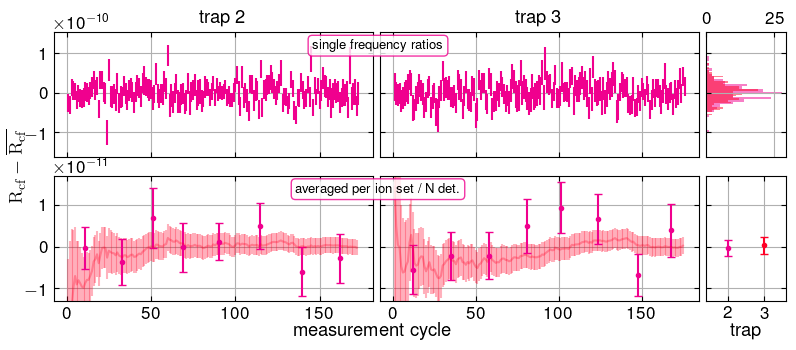

In [52]:
#plot settings=================================================================
#code adapted from https://scipy-cookbook.readthedocs.io/items/Matplotlib_LaTeX_Examples.html (2019/04/25)
fig_width = (3 + 3/8)*2 #in
golden_mean = (np.sqrt(5)-1.0)/2.0 # Aesthetic ratio
fig_height = fig_width/golden_mean # height in inches
#fig_height = 4
fig_size = [fig_width, fig_height]
fig_size = [8, 3.5]
textsize = 13

#=============================================================================
mpl.rcParams.update(mpl.rcParamsDefault)

params = {'text.usetex': True,
          'pgf.rcfonts' : False,
          'pgf.preamble': [r'\usepackage[utf8]{inputenc}',
                           r'\usepackage[T1]{fontenc}'],
          'pgf.texsystem': 'pdflatex',
          'axes.labelsize': 14,
          'axes.titlesize': 14,
          'font.size': textsize,
          'legend.fontsize': 11,
          'xtick.labelsize': 14,
          'ytick.labelsize': 14,
          'xtick.direction': 'in',
          'ytick.direction': 'in',
          'axes.grid': True,
          'axes.linewidth': 0.8,
          'axes.formatter.useoffset': False,
          'savefig.bbox': "tight",
          'figure.figsize': fig_size,
          'font.serif': 'sans-serif',
          'font.family': 'sans-serif',
          }

mpl.rcParams.update(params)
#==============================================================================
mpl.rcParams.update(mpl.rcParamsDefault)

#Options
params = {  'text.usetex' : True,
            'font.size' : 13,
            'axes.grid': True,
            'axes.linewidth': 0.8,
            'axes.formatter.useoffset': False,
            'xtick.direction': 'in',
            'ytick.direction': 'in',
            'xtick.top' : True,
            'ytick.right' : True,
            'figure.figsize': fig_size,
            'text.latex.preamble': r"""
            \usepackage[scaled]{helvet}\usepackage{sansmath}\sansmath\usepackage{amsmath}\usepackage{mathtools}
            \newcommand*\standardrel{<}% Change this to `=' for mtpro2
            \newcommand*\standardbin{+}
            % Tabular relation and binary symbols
            \makeatletter
            \newcommand*\tabularrel[1]{%
              \mathrel{\mathpalette{\@tabularsym\standardrel}{#1}}%
            }
            \newcommand*\tabularbin[1]{%
              \mathbin{\mathpalette{\@tabularsym\standardbin}{#1}}%
            }
            \newcommand*\@tabularsym[3]{%
              % #1: standard symbol
              % #2: math style
              % #3: user symbol
              \setbox\z@\hbox{$#2#1\m@th$}%
              \hbox to\wd\z@{\hss$#2#3\m@th$\hss}%
            }
            \makeatother"""
}
plt.rcParams.update(params)
#==============================================================================
labelsize = 14

if False: # pgf latex export
    mpl.use("pgf")
    mpl.rcParams.update({
        "pgf.texsystem": "pdflatex",
        'font.family': 'sans serif',
        'text.usetex': True,
        'pgf.rcfonts': False,
    })

        
        
thisdata = method_results['step09_interpolate_results']#step10_polyfit_best
#display(thisdata)

visualization.resultsplotA(thisdata, color=(240, 0, 142), colorB=(255, 0, 38), save='yb172176_interpol.pdf', rcparams=params)
#resultsplot(method_results['step12_cancel_interpol_results'])

Rmean 1.0233035267072 1.1635059735762796e-12 1.5016304826075866e-12
('176Yb42+_172Yb42+_176Yb42+_var_1', 1.0)
('176Yb42+_172Yb42+_176Yb42+_var_10', 1.0)
('176Yb42+_172Yb42+_176Yb42+_var_10', 2.0)
('176Yb42+_172Yb42+_176Yb42+_var_11', 1.0)
('176Yb42+_172Yb42+_176Yb42+_var_12', 1.0)
('176Yb42+_172Yb42+_176Yb42+_var_4', 1.0)
('176Yb42+_172Yb42+_176Yb42+_var_6', 1.0)
('176Yb42+_172Yb42+_176Yb42+_var_8', 1.0)
2.0 -1.319275999102422e-16 1.5016304824371357e-12


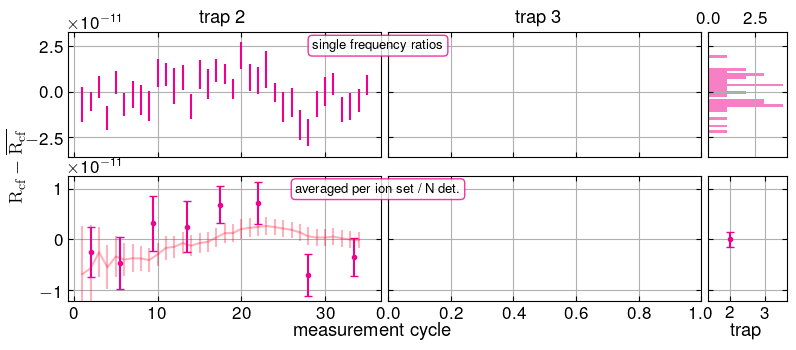

In [51]:
        
thisdata = method_results['step13_cancel_polyfit_best']#
#display(thisdata)

visualization.resultsplotA(thisdata, color=(240, 0, 142), colorB=(255, 0, 38), save='yb172176_poly.pdf', rcparams=params)

In [31]:
thisdata = step7_first_filter
#thisdata = method_results['step10_polyfit_best']#step10_polyfit_best
results = pd.DataFrame()
pprint(configs.keys())

for meas, mdata in thisdata.groupby('measurement'):
    conf = configs[meas]
    
    for trap, tdata in mdata.groupby('trap'):
        if tdata.acc_time.mean() < 15:
            continue
        exc_amp = conf['position_1']['configuration']['traps'][trap]['excitation_amplitude']
        R, err_in, err_out, chi2red = statistics.complete_mean_and_error(tdata.dphase_p*180/np.pi) 
        dR = max([err_in, err_out])
        da = pd.Series({'R': R, 'dR': dR, 'err_in': err_in, 'err_out': err_out,
                  'exc_amp': exc_amp, 'trap': int(trap), 'measurement': meas})
        print(exc_amp, tdata.acc_time.mean())
        results = results.append(da, ignore_index=True)
        
display(results)


dict_keys(['176Yb42+_172Yb42+_176Yb42+_var_1', '176Yb42+_172Yb42+_176Yb42+_var_10', '176Yb42+_172Yb42+_176Yb42+_var_11', '176Yb42+_172Yb42+_176Yb42+_var_12', '176Yb42+_172Yb42+_176Yb42+_var_4', '176Yb42+_172Yb42+_176Yb42+_var_6', '176Yb42+_172Yb42+_176Yb42+_var_8'])
0.4 99.95
0.4 99.95
0.4 99.95
0.4 99.95000000000003
0.4 99.95
0.4 99.95
0.4 129.95000000000002
0.4 129.95000000000002
0.4 69.94999999999999
0.4 69.94999999999999
0.4 99.95
0.4 99.95
0.4 99.95
0.4 99.94999999999999


,R,dR,err_in,err_out,exc_amp,measurement,trap
0,15.8210307873298,0.9981171713931,-inf,0.9981171713931,0.4000000000000,176Yb42+_172Yb42+_176Yb42+_var_1,2.0000000000000
1,19.0413398561824,0.5376932738298,-inf,0.5376932738298,0.4000000000000,176Yb42+_172Yb42+_176Yb42+_var_1,3.0000000000000
2,14.4710972378147,0.3687372269506,-inf,0.3687372269506,0.4000000000000,176Yb42+_172Yb42+_176Yb42+_var_10,2.0000000000000
3,16.2008972077009,0.3649480835962,-inf,0.3649480835962,0.4000000000000,176Yb42+_172Yb42+_176Yb42+_var_10,3.0000000000000
4,14.5865983277658,0.3564240870278,-inf,0.3564240870278,0.4000000000000,176Yb42+_172Yb42+_176Yb42+_var_11,2.0000000000000
5,19.0632015732093,0.5670322882493,-inf,0.5670322882493,0.4000000000000,176Yb42+_172Yb42+_176Yb42+_var_11,3.0000000000000
6,17.5403713466027,0.6172723505344,-inf,0.6172723505344,0.4000000000000,176Yb42+_172Yb42+_176Yb42+_var_12,2.0000000000000
7,18.7260626217962,0.8350469417410,-inf,0.8350469417410,0.4000000000000,176Yb42+_172Yb42+_176Yb42+_var_12,3.0000000000000
8,10.9754672658187,0.3358749255184,-inf,0.3358749255184,0.4000000000000,176Yb42+_172Yb42+_176Yb42+_var_4,2.0000000000000
9,13.1144149771275,0.3023918288919,-inf,0.3023918288919,0.4000000000000,176Yb42+_172Yb42+_176Yb42+_var_4,3.0000000000000


In [32]:
thisdata = method_results['step09_interpolate_results']#step10_polyfit_best
#thisdata = method_results['step10_polyfit_best']#step10_polyfit_best
results = pd.DataFrame()
pprint(configs.keys())

for meas, mdata in thisdata.groupby('measurement'):
    conf = configs[meas]
    exc_amp3 = conf['position_1']['configuration']['traps'][3]['excitation_amplitude']
    ctp = conf.get('pre_cooling_time_nu_p', None)
    ctm = conf.get('pre_cooling_time_nu_m', None)
    cap = conf.get('pre_cooling_amp_nu_p', None)
    cam = conf.get('pre_cooling_amp_nu_m', None)
    
    for trap, tdata in mdata.groupby('trap'):
        exc_amp = conf['position_1']['configuration']['traps'][trap]['excitation_amplitude']
        exc_time = conf['position_1']['configuration']['excitation_time']
        R, err_in, err_out, chi2red = statistics.complete_mean_and_error(tdata.R, tdata.dR)
        dR = max([err_in, err_out])
        da = pd.Series({'R': R, 'dR': dR, 'err_in': err_in, 'err_out': err_out,
                  'exc_amp': exc_amp, 'exc_time': exc_time, 'trap': int(trap), 'measurement': meas,
                  'ctp': ctp, 'ctm': ctm, 'cap': cap, 'cam': cam})
        
        results = results.append(da, ignore_index=True)
        
display(results)


dict_keys(['176Yb42+_172Yb42+_176Yb42+_var_1', '176Yb42+_172Yb42+_176Yb42+_var_10', '176Yb42+_172Yb42+_176Yb42+_var_11', '176Yb42+_172Yb42+_176Yb42+_var_12', '176Yb42+_172Yb42+_176Yb42+_var_4', '176Yb42+_172Yb42+_176Yb42+_var_6', '176Yb42+_172Yb42+_176Yb42+_var_8'])


,R,cam,cap,ctm,ctp,dR,err_in,err_out,exc_amp,exc_time,measurement,trap
0,1.0233035267059,0.2000000000000,0.9000000000000,40.0000000000000,10.0000000000000,0.0000000000051,0.0000000000051,0.0000000000045,0.4000000000000,0.0003000000000,176Yb42+_172Yb42+_176Yb42+_var_1,2.0000000000000
1,1.0233035267007,0.2000000000000,0.9000000000000,40.0000000000000,10.0000000000000,0.0000000000059,0.0000000000059,0.0000000000045,0.4000000000000,0.0003000000000,176Yb42+_172Yb42+_176Yb42+_var_1,3.0000000000000
2,1.0233035267064,0.2000000000000,0.9000000000000,40.0000000000000,10.0000000000000,0.0000000000044,0.0000000000044,0.0000000000038,0.4000000000000,0.0003000000000,176Yb42+_172Yb42+_176Yb42+_var_10,2.0000000000000
3,1.0233035267040,0.2000000000000,0.9000000000000,40.0000000000000,10.0000000000000,0.0000000000040,0.0000000000040,0.0000000000037,0.4000000000000,0.0003000000000,176Yb42+_172Yb42+_176Yb42+_var_10,3.0000000000000
4,1.0233035267060,0.2000000000000,0.9000000000000,40.0000000000000,10.0000000000000,0.0000000000060,0.0000000000057,0.0000000000060,0.4000000000000,0.0003000000000,176Yb42+_172Yb42+_176Yb42+_var_11,2.0000000000000
5,1.0233035267111,0.2000000000000,0.9000000000000,40.0000000000000,10.0000000000000,0.0000000000066,0.0000000000066,0.0000000000052,0.4000000000000,0.0003000000000,176Yb42+_172Yb42+_176Yb42+_var_11,3.0000000000000
6,1.0233035267074,0.2000000000000,0.9000000000000,40.0000000000000,10.0000000000000,0.0000000000045,0.0000000000045,0.0000000000031,0.4000000000000,0.0003000000000,176Yb42+_172Yb42+_176Yb42+_var_12,2.0000000000000
7,1.0233035267155,0.2000000000000,0.9000000000000,40.0000000000000,10.0000000000000,0.0000000000061,0.0000000000061,0.0000000000051,0.4000000000000,0.0003000000000,176Yb42+_172Yb42+_176Yb42+_var_12,3.0000000000000
8,1.0233035267111,0.2000000000000,0.9000000000000,40.0000000000000,10.0000000000000,0.0000000000054,0.0000000000048,0.0000000000054,0.4000000000000,0.0003000000000,176Yb42+_172Yb42+_176Yb42+_var_4,2.0000000000000
9,1.0233035267128,0.2000000000000,0.9000000000000,40.0000000000000,10.0000000000000,0.0000000000060,0.0000000000060,0.0000000000054,0.4000000000000,0.0003000000000,176Yb42+_172Yb42+_176Yb42+_var_4,3.0000000000000


In [33]:
fig = px.scatter(results, x="cam", y="exc_amp", facet_row="trap", hover_data=["measurement"], opacity=0.5)
fig.show()

In [34]:
para = "cam"
plt.rcParams['figure.figsize'] = (24, 9)

print(para)
for trap, tdata in results.groupby('trap'):
    for exc_amp, data2 in tdata.groupby("exc_amp"):
        print("trap", trap, "excamp", exc_amp)
        parlist = []
        Rlist = []
        dRlist = []
        if len(data2[para].unique()) < 2:
            print("not enough para\n")
            continue
            
        for par, data3 in data2.groupby(para):
            R, err_in, err_out, chi2red = statistics.complete_mean_and_error(data3.R, data3.dR)
            dR = max([err_in, err_out])
            parlist.append(par)
            Rlist.append(R)
            dRlist.append(dR)
        print(para, parlist)
        print("R", Rlist)
        print("diff to first", np.asarray(Rlist)-Rlist[0])
        print("dR", dRlist)
        
        


cam
trap 2.0 excamp 0.4
not enough para

trap 3.0 excamp 0.4
not enough para



In [35]:
# convidance band stuff

# error propgation formula sigma_y^2 = A^T U A 
def sigma_y_fit(x, pcov = np.zeros((2,2)), order = 2):
    j = []
    for i in range(order+1):
        j.append(x**i)
    #print(j)
    
    J = np.asarray(j)[::-1] # feature vector
    #print(J)
    
    return np.sqrt(np.transpose(J).dot(pcov.dot(J)))

# vectorized version so that numpy array can be used as argument 
v_sigma_y_fit = np.vectorize(sigma_y_fit, excluded=['pcov', 'order'])

# alternative solution using dtype=object (does not need to be vectorized)
#def sigma_y_fit_alt(x):
#    J = np.array([1., x, x**2], dtype=object)
#    return np.sqrt(np.transpose(J).dot(U.dot(J)))

In [36]:


fig = px.scatter(results, x="exc_amp", y="R", error_y="dR", facet_row="trap", hover_data=["measurement"])
fig.show()


last_R = 0
last_dR = 0
diff = 0
ddiff = 0

res = []

max_x = 0
rho_per_amp = [0, 0, 75, 85] # idx is trap


mpl.rcParams['mathtext.fontset'] = 'custom'
mpl.rcParams['mathtext.rm'] = 'Bitstream Vera Sans'
mpl.rcParams['mathtext.it'] = 'Bitstream Vera Sans:italic'
mpl.rcParams['mathtext.bf'] = 'Bitstream Vera Sans:bold'
plt.rcParams["figure.figsize"] = (7,2.5)
plt.rcParams["figure.figsize"] = (20,10.5)
font = {'size'   : 10}

R_offset = 1.000378141750

excamps = results.exc_amp.unique()

if len(excamps) > 3:

    #for trap, tdata in reversed(tuple(results.groupby('trap'))):
    for trap, tdata in results.groupby('trap'):
        trapi = int(trap)
        # averaged
        x = []
        y = []
        yerr = []
        upscale = 1e12
        for exc_amp, data2 in tdata.groupby("exc_amp"):
            R, err_in, err_out, chi2red = statistics.complete_mean_and_error(data2.R-R_offset, data2.dR)
            print("trap, exc, errin, errout, Rs, dRs", trap, exc_amp, err_in, err_out, data2.R.to_numpy(), data2.dR.to_numpy())
            x.append(exc_amp)
            y.append(R*upscale)
            yerr.append(max([err_in, err_out])*upscale)
            #yerr.append(err_in)

        # not averaged
        #y = tdata.R.to_numpy()
        #yerr = tdata.dR.to_numpy()
        #x = tdata.exc_amp.to_numpy()**2

        # scale x ?
        x = np.asarray(x)*rho_per_amp[trapi]
        print('excitation radii', x)

        # to radii conversion? (rough...)
        #x = np.asarray(x)*1e-5
        # squared x?
        x = np.asarray(x)**2

        maxamp = max(x)
        max_x = max(maxamp, max_x)

        # fit

        """
        def polyeven(x, R, p2):#, p4):
            return R + p2*x**2 #+ p4*x**4

        init_vals = [R-R_offset, 0]#, 0]
        popt, pcov = scipy.optimize.curve_fit(polyeven, x, y, p0=init_vals)
        perr = np.sqrt(np.diag(pcov))
        print(popt)
        print(perr)
        print(trap, popt[0], popt[0]-1, perr[0])
        print(trap, popt[0]-R, dR, perr[0])
        R = popt[0]
        dR = perr[0]
        """

        order = 1
        weights = 1/np.asarray(yerr)
        popt, pcov = np.polyfit(x, y, order, w=weights, cov=True)
        perr = np.sqrt(np.diag(pcov))
        print(popt)
        print(pcov)
        print(perr)
        print(perr/popt)
        print(trap, popt[-1], popt[-1]-1, perr[-1])
        Rfit = popt[-1]
        dRfit = perr[-1]

        xrange = np.linspace(0, maxamp*1.1, 100)
        #fity = polyeven(xrange, popt[0], popt[1])#, popt[2])
        fity = np.polyval(popt, xrange)

        sigmas = v_sigma_y_fit(xrange, pcov=pcov, order=order)

        if trapi == 2:
            fmtd = ","
            fmtf = "-"
            cd = "tomato"
            cf = "tomato"
        else:
            fmtd = "."
            fmtf = "-"
            cd = "teal"
            cf = "teal"

        plt.errorbar(np.sqrt(x), np.asarray(y), yerr, fmt=fmtd, c=cd, label="trap "+str(trapi))
        #plt.errorbar([0], [Rfit], [dRfit], fmt=fmtd, c=cd, capsize=2*trapi, elinewidth=3, capthick=3)#, alpha=0.5)
        plt.plot(np.sqrt(xrange), fity, c=cf) #, label="fit (trap "+str(trapi)+")")
        plt.fill_between(np.sqrt(xrange), fity - sigmas, fity + sigmas, alpha=0.3, color=cf)

        res.append( [trap, Rfit, dRfit] )

        #plt.xlim(-0.05*np.sqrt(max_x), np.sqrt(max_x*1.1))
        plt.xlim(0, np.sqrt(max_x*1.1))
        plt.ylabel(r"$\mathcal{R}^{{CF}}$ - " + '%.12f' % R_offset + r" $(10^{-12})$")
        #plt.xlabel(r"$\left( \kappa \rho_+ \right)^{2}$")
        #plt.xlabel(r"$A_{excitation}^{2}$ (arb. units)")
        plt.xlabel(r"radial amplitude $\rho_+$ ($\mu$m)")
        plt.legend()
        plt.grid()
        ax1 = plt.gca()
        ax1.tick_params(direction="in", bottom=True, top=True, left=True, right=True)
        plt.tight_layout()

        #plt.savefig("ratio_extrapolation.svg")
        #plt.savefig("ratio_extrapolation.png", dpi=300)
        plt.show()

    res = np.asarray(res)
    print(res)

    R0, err_in, err_out, chi2red = statistics.complete_mean_and_error(res[:,1], res[:,2], student = False)
    dR0 = max([err_in, err_out])
    print('mean R, dR0, errin, errout', R0, dR0, err_in, err_out)
    res = np.append(res, [[1, R0, dR0]], axis=0)
    print(res)

    for i in range(len(res)):
        plt.errorbar( res[i][0], res[i][1], res[i][2], fmt="o" )

    plt.xlabel("trap")
    plt.ylabel("R")
    plt.grid()
    plt.tight_layout()
    plt.show()

else:
    print("not enough excitations used, only", len(excamps))

not enough excitations used, only 1


In [37]:


fig = px.scatter(results, x="exc_amp", y="R", error_y="dR", facet_row="trap", hover_data=["measurement"])
fig.show()


last_R = 0
last_dR = 0
diff = 0
ddiff = 0

res = []

max_x = 0
rho_per_amp = [0, 0, 75, 88] # idx is trap


mpl.rcParams['mathtext.fontset'] = 'custom'
mpl.rcParams['mathtext.rm'] = 'Bitstream Vera Sans'
mpl.rcParams['mathtext.it'] = 'Bitstream Vera Sans:italic'
mpl.rcParams['mathtext.bf'] = 'Bitstream Vera Sans:bold'
plt.rcParams["figure.figsize"] = (7,2.5)
font = {'size'   : 10}

R_offset = 1.000378141700

if len(excamps) > 3:

    #for trap, tdata in reversed(tuple(results.groupby('trap'))):
    for trap, tdata in results.groupby('trap'):
        trapi = int(trap)
        # averaged
        x = []
        y = []
        yerr = []
        upscale = 1e12
        for exc_amp, data2 in tdata.groupby("exc_amp"):
            R, err_in, err_out, chi2red = statistics.complete_mean_and_error(data2.R-R_offset, data2.dR)
            print("trap, exc, errin, errout, Rs, dRs", trap, exc_amp, err_in, err_out, data2.R.to_numpy(), data2.dR.to_numpy())
            x.append(exc_amp)
            y.append(R*upscale)
            yerr.append(max([err_in, err_out])*upscale)
            #yerr.append(err_in)

        # not averaged
        #y = tdata.R.to_numpy()
        #yerr = tdata.dR.to_numpy()
        #x = tdata.exc_amp.to_numpy()**2

        # scale x ?
        x = np.asarray(x)*rho_per_amp[trapi]
        print('excitation radii', x)

        # to radii conversion? (rough...)
        #x = np.asarray(x)*1e-5
        # squared x?
        x = np.asarray(x)**2

        maxamp = max(x)
        max_x = max(maxamp, max_x)

        # fit

        """
        def polyeven(x, R, p2):#, p4):
            return R + p2*x**2 #+ p4*x**4

        init_vals = [R-R_offset, 0]#, 0]
        popt, pcov = scipy.optimize.curve_fit(polyeven, x, y, p0=init_vals)
        perr = np.sqrt(np.diag(pcov))
        print(popt)
        print(perr)
        print(trap, popt[0], popt[0]-1, perr[0])
        print(trap, popt[0]-R, dR, perr[0])
        R = popt[0]
        dR = perr[0]
        """

        order = 1
        weights = 1/np.asarray(yerr)
        popt, pcov = np.polyfit(x, y, order, w=weights, cov=True)
        perr = np.sqrt(np.diag(pcov))
        print(popt)
        print(pcov)
        print(perr)
        print(perr/popt)
        print(trap, popt[-1], popt[-1]-1, perr[-1])
        Rfit = popt[-1]
        dRfit = perr[-1]

        xrange = np.linspace(0, maxamp*1.1, 100)
        #fity = polyeven(xrange, popt[0], popt[1])#, popt[2])
        fity = np.polyval(popt, xrange)

        residuals = y-np.polyval(popt, x)
        N = len(residuals)
        k = len(popt)
        chi2 = sum((residuals / yerr) ** 2)
        chi2red = chi2 / (N-k)
        AIC = N*np.log( np.sum( residuals**2 ) ) + 2*k
        AICc = AIC + (2*k**2 + 2*k) / (N-k-1)
        print("chi2red, AIC, AICc", chi2red, AIC, AICc)

        sigmas = v_sigma_y_fit(xrange, pcov=pcov, order=order)

        if trapi == 2:
            fmtd = ","
            fmtf = "-"
            cd = "tomato"
            cf = "tomato"
        else:
            fmtd = "."
            fmtf = "-"
            cd = "teal"
            cf = "teal"

        # x**1 axis
        plt.errorbar(np.sqrt(x), np.asarray(y), yerr, fmt=fmtd, c=cd, label="trap "+str(trapi))
        ####plt.errorbar([0], [Rfit], [dRfit], fmt=fmtd, c=cd, capsize=2*trapi, elinewidth=3, capthick=3)#, alpha=0.5)
        plt.plot(np.sqrt(xrange), fity, c=cf) #, label="fit (trap "+str(trapi)+")")
        plt.fill_between(np.sqrt(xrange), fity - sigmas, fity + sigmas, alpha=0.3, color=cf)

        # x**2 axis
        #plt.errorbar(x, np.asarray(y), yerr, fmt=fmtd, c=cd, label="trap "+str(trapi))
        #####plt.errorbar([0], [Rfit], [dRfit], fmt=fmtd, c=cd, capsize=2*trapi, elinewidth=3, capthick=3)#, alpha=0.5)
        #plt.plot(xrange, fity, c=cf) #, label="fit (trap "+str(trapi)+")")
        #plt.fill_between(xrange, fity - sigmas, fity + sigmas, alpha=0.3, color=cf)

        res.append( [trap, Rfit, dRfit] )

    #plt.xlim(-0.05*np.sqrt(max_x), np.sqrt(max_x*1.1))
    plt.xlim(0, np.sqrt(max_x*1.1))
    #plt.xlim(0, max_x*1.1)
    plt.ylabel(r"$\mathcal{R}^{{CF}}$ - " + '%.12f' % R_offset + r" $(10^{-12})$")
    #plt.xlabel(r"$\left( \kappa \rho_+ \right)^{2}$")
    #plt.xlabel(r"$A_{excitation}^{2}$ (arb. units)")
    plt.xlabel(r"excitation amplitude $\rho_+$ ($\mu$m)")
    #plt.xlabel(r"squared radial excitation amplitude $\rho_+^2$ ($\mu$m$^2$)")
    plt.legend()
    plt.grid()
    ax1 = plt.gca()
    ax1.tick_params(direction="in", bottom=True, top=True, left=True, right=True)
    plt.tight_layout()

    plt.savefig("ratio_extrapolation_p2_x1.svg")
    plt.savefig("ratio_extrapolation_p2_x1.png", dpi=300)
    plt.show()

    res = np.asarray(res)
    print(res)

    R0, err_in, err_out, chi2red = statistics.complete_mean_and_error(res[:,1], res[:,2], student = False)
    dR0 = max([err_in, err_out])
    print('mean R, dR0, errin, errout', R0, dR0, err_in, err_out)
    res = np.append(res, [[1, R0, dR0]], axis=0)
    print(res)

    for i in range(len(res)):
        plt.errorbar( res[i][0], res[i][1], res[i][2], fmt="o" )

    plt.xlabel("trap")
    plt.ylabel("R")
    plt.grid()
    plt.tight_layout()
    plt.show()

else:
    print("not enough excitations used, only", len(excamps))

not enough excitations used, only 1


In [38]:


fig = px.scatter(results, x="exc_amp", y="R", error_y="dR", facet_row="trap", hover_data=["measurement"])
fig.show()


last_R = 0
last_dR = 0
diff = 0
ddiff = 0

res = []

max_x = 0

mpl.rcParams['mathtext.fontset'] = 'custom'
mpl.rcParams['mathtext.rm'] = 'Bitstream Vera Sans'
mpl.rcParams['mathtext.it'] = 'Bitstream Vera Sans:italic'
mpl.rcParams['mathtext.bf'] = 'Bitstream Vera Sans:bold'
plt.rcParams["figure.figsize"] = (7,2.5)
font = {'size'   : 10}

R_offset = 1.000378141700

if len(excamps) > 3:

    #for trap, tdata in reversed(tuple(results.groupby('trap'))):
    for trap, tdata in results.groupby('trap'):
        trapi = int(trap)
        # averaged
        x = []
        y = []
        yerr = []
        upscale = 1e12
        for exc_amp, data2 in tdata.groupby("exc_amp"):
            R, err_in, err_out, chi2red = statistics.complete_mean_and_error(data2.R-R_offset, data2.dR)
            print("trap, exc, errin, errout, Rs, dRs", trap, exc_amp, err_in, err_out, data2.R.to_numpy(), data2.dR.to_numpy())
            x.append(exc_amp)
            y.append(R*upscale)
            yerr.append(max([err_in, err_out])*upscale)
            #yerr.append(err_in)

        # not averaged
        #y = tdata.R.to_numpy()
        #yerr = tdata.dR.to_numpy()
        #x = tdata.exc_amp.to_numpy()**2

        # scale x ?
        x = np.asarray(x)*rho_per_amp[trapi]
        print('excitation radii', x)

        # to radii conversion? (rough...)
        #x = np.asarray(x)*1e-5
        # squared x?
        x = np.asarray(x)**2

        maxamp = max(x)
        max_x = max(maxamp, max_x)

        # fit

        """
        def polyeven(x, R, p2):#, p4):
            return R + p2*x**2 #+ p4*x**4

        init_vals = [R-R_offset, 0]#, 0]
        popt, pcov = scipy.optimize.curve_fit(polyeven, x, y, p0=init_vals)
        perr = np.sqrt(np.diag(pcov))
        print(popt)
        print(perr)
        print(trap, popt[0], popt[0]-1, perr[0])
        print(trap, popt[0]-R, dR, perr[0])
        R = popt[0]
        dR = perr[0]
        """

        order = 1
        weights = 1/np.asarray(yerr)
        popt, pcov = np.polyfit(x, y, order, w=weights, cov=True)
        perr = np.sqrt(np.diag(pcov))
        print(popt)
        print(pcov)
        print(perr)
        print(perr/popt)
        print(trap, popt[-1], popt[-1]-1, perr[-1])
        Rfit = popt[-1]
        dRfit = perr[-1]

        xrange = np.linspace(0, maxamp*1.1, 100)
        #fity = polyeven(xrange, popt[0], popt[1])#, popt[2])
        fity = np.polyval(popt, xrange)

        residuals = y-np.polyval(popt, x)
        N = len(residuals)
        k = len(popt)
        chi2 = sum((residuals / yerr) ** 2)
        chi2red = chi2 / (N-k)
        AIC = N*np.log( np.sum( residuals**2 ) ) + 2*k
        AICc = AIC + (2*k**2 + 2*k) / (N-k-1)
        print("chi2red, AIC, AICc", chi2red, AIC, AICc)

        sigmas = v_sigma_y_fit(xrange, pcov=pcov, order=order)

        if trapi == 2:
            fmtd = ","
            fmtf = "-"
            cd = "tomato"
            cf = "tomato"
        else:
            fmtd = "."
            fmtf = "-"
            cd = "teal"
            cf = "teal"

        # x**1 axis
        #plt.errorbar(np.sqrt(x), np.asarray(y), yerr, fmt=fmtd, c=cd, label="trap "+str(trapi))
        ####plt.errorbar([0], [Rfit], [dRfit], fmt=fmtd, c=cd, capsize=2*trapi, elinewidth=3, capthick=3)#, alpha=0.5)
        #plt.plot(np.sqrt(xrange), fity, c=cf) #, label="fit (trap "+str(trapi)+")")
        #plt.fill_between(np.sqrt(xrange), fity - sigmas, fity + sigmas, alpha=0.3, color=cf)

        # x**2 axis
        plt.errorbar(x, np.asarray(y), yerr, fmt=fmtd, c=cd, label="trap "+str(trapi))
        ####plt.errorbar([0], [Rfit], [dRfit], fmt=fmtd, c=cd, capsize=2*trapi, elinewidth=3, capthick=3)#, alpha=0.5)
        plt.plot(xrange, fity, c=cf) #, label="fit (trap "+str(trapi)+")")
        plt.fill_between(xrange, fity - sigmas, fity + sigmas, alpha=0.3, color=cf)

        res.append( [trap, Rfit, dRfit] )

    #plt.xlim(-0.05*np.sqrt(max_x), np.sqrt(max_x*1.1))
    #plt.xlim(0, np.sqrt(max_x*1.1))
    plt.xlim(0, max_x*1.1)
    plt.ylabel(r"$\mathcal{R}^{{CF}}$ - " + '%.12f' % R_offset + r" $(10^{-12})$")
    #plt.xlabel(r"$\left( \kappa \rho_+ \right)^{2}$")
    #plt.xlabel(r"$A_{excitation}^{2}$ (arb. units)")
    #plt.xlabel(r"excitation amplitude $\rho_+$ ($\mu$m)")
    plt.xlabel(r"squared excitation amplitude $\rho_+^2$ ($\mu$m$^2$)")
    plt.legend()
    plt.grid()
    ax1 = plt.gca()
    ax1.tick_params(direction="in", bottom=True, top=True, left=True, right=True)
    plt.tight_layout()

    plt.savefig("ratio_extrapolation_p2_x2.svg")
    plt.savefig("ratio_extrapolation_p2_x2.png", dpi=300)
    plt.show()

    res = np.asarray(res)
    print(res)

    R0, err_in, err_out, chi2red = statistics.complete_mean_and_error(res[:,1], res[:,2], student = False)
    dR0 = max([err_in, err_out])
    print('mean R, dR0, errin, errout', R0, dR0, err_in, err_out)
    res = np.append(res, [[1, R0, dR0]], axis=0)
    print(res)

    for i in range(len(res)):
        plt.errorbar( res[i][0], res[i][1], res[i][2], fmt="o" )

    plt.xlabel("trap")
    plt.ylabel("R")
    plt.grid()
    plt.tight_layout()
    plt.show()

else:
    print("not enough excitations used, only", len(excamps))

not enough excitations used, only 1


In [39]:


fig = px.scatter(results, x="exc_amp", y="R", error_y="dR", facet_row="trap", hover_data=["measurement"])
fig.show()


last_R = 0
last_dR = 0
diff = 0
ddiff = 0

res = []

max_x = 0
rho_per_amp = [0, 0, 75, 85] # idx is trap


mpl.rcParams['mathtext.fontset'] = 'custom'
mpl.rcParams['mathtext.rm'] = 'Bitstream Vera Sans'
mpl.rcParams['mathtext.it'] = 'Bitstream Vera Sans:italic'
mpl.rcParams['mathtext.bf'] = 'Bitstream Vera Sans:bold'
plt.rcParams["figure.figsize"] = (7,2.5)
font = {'size'   : 10}

R_offset = 1.000378141700

if len(excamps) > 3:

    #for trap, tdata in reversed(tuple(results.groupby('trap'))):
    for trap, tdata in results.groupby('trap'):
        trapi = int(trap)
        # averaged
        x = []
        y = []
        yerr = []
        upscale = 1e12
        for exc_amp, data2 in tdata.groupby("exc_amp"):
            R, err_in, err_out, chi2red = statistics.complete_mean_and_error(data2.R-R_offset, data2.dR)
            print("trap, exc, errin, errout, Rs, dRs", trap, exc_amp, err_in, err_out, data2.R.to_numpy(), data2.dR.to_numpy())
            x.append(exc_amp)
            y.append(R*upscale)
            yerr.append(max([err_in, err_out])*upscale)
            #yerr.append(err_in)

        # not averaged
        #y = tdata.R.to_numpy()
        #yerr = tdata.dR.to_numpy()
        #x = tdata.exc_amp.to_numpy()**2

        # scale x ?
        x = np.asarray(x)*rho_per_amp[trapi]
        print('excitation radii', x)

        # to radii conversion? (rough...)
        #x = np.asarray(x)*1e-5
        # squared x?
        x = np.asarray(x)**2

        maxamp = max(x)
        max_x = max(maxamp, max_x)

        # fit

        """
        def polyeven(x, R, p2):#, p4):
            return R + p2*x**2 #+ p4*x**4

        init_vals = [R-R_offset, 0]#, 0]
        popt, pcov = scipy.optimize.curve_fit(polyeven, x, y, p0=init_vals)
        perr = np.sqrt(np.diag(pcov))
        print(popt)
        print(perr)
        print(trap, popt[0], popt[0]-1, perr[0])
        print(trap, popt[0]-R, dR, perr[0])
        R = popt[0]
        dR = perr[0]
        """

        order = 2
        weights = 1/np.asarray(yerr)
        popt, pcov = np.polyfit(x, y, order, w=weights, cov=True)
        perr = np.sqrt(np.diag(pcov))
        print(popt)
        print(pcov)
        print(perr)
        print(perr/popt)
        print(trap, popt[-1], popt[-1]-1, perr[-1])
        Rfit = popt[-1]
        dRfit = perr[-1]

        xrange = np.linspace(0, maxamp*1.1, 100)
        #fity = polyeven(xrange, popt[0], popt[1])#, popt[2])
        fity = np.polyval(popt, xrange)

        residuals = y-np.polyval(popt, x)
        N = len(residuals)
        k = len(popt)
        chi2 = sum((residuals / yerr) ** 2)
        chi2red = chi2 / (N-k)
        AIC = N*np.log( np.sum( residuals**2 ) ) + 2*k
        AICc = AIC + (2*k**2 + 2*k) / (N-k-1)
        print("chi2red, AIC, AICc", chi2red, AIC, AICc)

        sigmas = v_sigma_y_fit(xrange, pcov=pcov, order=order)

        if trapi == 2:
            fmtd = ","
            fmtf = "-"
            cd = "tomato"
            cf = "tomato"
        else:
            fmtd = "."
            fmtf = "-"
            cd = "teal"
            cf = "teal"

        plt.errorbar(np.sqrt(x), np.asarray(y), yerr, fmt=fmtd, c=cd, label="trap "+str(trapi))
        #plt.errorbar([0], [Rfit], [dRfit], fmt=fmtd, c=cd, capsize=2*trapi, elinewidth=3, capthick=3)#, alpha=0.5)
        plt.plot(np.sqrt(xrange), fity, c=cf) #, label="fit (trap "+str(trapi)+")")
        plt.fill_between(np.sqrt(xrange), fity - sigmas, fity + sigmas, alpha=0.3, color=cf)

        res.append( [trap, Rfit, dRfit] )

    #plt.xlim(-0.05*np.sqrt(max_x), np.sqrt(max_x*1.1))
    plt.xlim(0, np.sqrt(max_x*1.1))
    plt.ylabel(r"$\mathcal{R}^{{CF}}$ - " + '%.12f' % R_offset + r" $(10^{-12})$")
    #plt.xlabel(r"$\left( \kappa \rho_+ \right)^{2}$")
    #plt.xlabel(r"$A_{excitation}^{2}$ (arb. units)")
    plt.xlabel(r"radial amplitude $\rho_+$ ($\mu$m)")
    plt.legend()
    plt.grid()
    ax1 = plt.gca()
    ax1.tick_params(direction="in", bottom=True, top=True, left=True, right=True)
    plt.tight_layout()

    plt.savefig("ratio_extrapolation_order4.svg")
    plt.savefig("ratio_extrapolation_order4.png", dpi=300)
    plt.show()

    res = np.asarray(res)
    print(res)

    R0, err_in, err_out, chi2red = statistics.complete_mean_and_error(res[:,1], res[:,2], student = False)
    dR0 = max([err_in, err_out])
    print('mean R, dR0, errin, errout', R0, dR0, err_in, err_out)
    res = np.append(res, [[1, R0, dR0]], axis=0)
    print(res)

    for i in range(len(res)):
        plt.errorbar( res[i][0], res[i][1], res[i][2], fmt="o" )

    plt.xlabel("trap")
    plt.ylabel("R")
    plt.grid()
    plt.tight_layout()
    plt.show()

else:
    print("not enough excitations used, only", len(excamps))

not enough excitations used, only 1


In [40]:
print(res)
res_before =res
print(res_before)
try:
    print(res[:,1] - res_before[:,1])
except:
    pass


[]
[]


In [41]:
fig = px.scatter(results, x="exc_amp", y="R", error_y="dR", facet_row="trap", hover_data=["measurement"])
fig.show()
last_R = 0
last_dR = 0
diff = 0
ddiff = 0
for trap, tdata in results.groupby('trap'):
    display(tdata)
    R, err_in, err_out, chi2red = statistics.complete_mean_and_error(tdata.R, tdata.dR)
    dR = max([err_in, err_out])
    print(trap, R, R-1, dR)
    diff = last_R - R
    ddiff = np.sqrt(dR**2 - last_dR**2)
    last_R = R
    last_dR = dR

print(diff, ddiff)

,R,cam,cap,ctm,ctp,dR,err_in,err_out,exc_amp,exc_time,measurement,trap
0,1.0233035267059,0.2000000000000,0.9000000000000,40.0000000000000,10.0000000000000,0.0000000000051,0.0000000000051,0.0000000000045,0.4000000000000,0.0003000000000,176Yb42+_172Yb42+_176Yb42+_var_1,2.0000000000000
2,1.0233035267064,0.2000000000000,0.9000000000000,40.0000000000000,10.0000000000000,0.0000000000044,0.0000000000044,0.0000000000038,0.4000000000000,0.0003000000000,176Yb42+_172Yb42+_176Yb42+_var_10,2.0000000000000
4,1.0233035267060,0.2000000000000,0.9000000000000,40.0000000000000,10.0000000000000,0.0000000000060,0.0000000000057,0.0000000000060,0.4000000000000,0.0003000000000,176Yb42+_172Yb42+_176Yb42+_var_11,2.0000000000000
6,1.0233035267074,0.2000000000000,0.9000000000000,40.0000000000000,10.0000000000000,0.0000000000045,0.0000000000045,0.0000000000031,0.4000000000000,0.0003000000000,176Yb42+_172Yb42+_176Yb42+_var_12,2.0000000000000
8,1.0233035267111,0.2000000000000,0.9000000000000,40.0000000000000,10.0000000000000,0.0000000000054,0.0000000000048,0.0000000000054,0.4000000000000,0.0003000000000,176Yb42+_172Yb42+_176Yb42+_var_4,2.0000000000000
10,1.0233035267001,0.2000000000000,0.9000000000000,40.0000000000000,10.0000000000000,0.0000000000058,0.0000000000048,0.0000000000058,0.4000000000000,0.0003000000000,176Yb42+_172Yb42+_176Yb42+_var_6,2.0000000000000
12,1.0233035267033,0.2000000000000,0.9000000000000,40.0000000000000,10.0000000000000,0.0000000000059,0.0000000000059,0.0000000000041,0.4000000000000,0.0003000000000,176Yb42+_172Yb42+_176Yb42+_var_8,2.0000000000000


2.0 1.0233035267060386 0.023303526706038635 1.9602447349165478e-12


,R,cam,cap,ctm,ctp,dR,err_in,err_out,exc_amp,exc_time,measurement,trap
1,1.0233035267007,0.2000000000000,0.9000000000000,40.0000000000000,10.0000000000000,0.0000000000059,0.0000000000059,0.0000000000045,0.4000000000000,0.0003000000000,176Yb42+_172Yb42+_176Yb42+_var_1,3.0000000000000
3,1.0233035267040,0.2000000000000,0.9000000000000,40.0000000000000,10.0000000000000,0.0000000000040,0.0000000000040,0.0000000000037,0.4000000000000,0.0003000000000,176Yb42+_172Yb42+_176Yb42+_var_10,3.0000000000000
5,1.0233035267111,0.2000000000000,0.9000000000000,40.0000000000000,10.0000000000000,0.0000000000066,0.0000000000066,0.0000000000052,0.4000000000000,0.0003000000000,176Yb42+_172Yb42+_176Yb42+_var_11,3.0000000000000
7,1.0233035267155,0.2000000000000,0.9000000000000,40.0000000000000,10.0000000000000,0.0000000000061,0.0000000000061,0.0000000000051,0.4000000000000,0.0003000000000,176Yb42+_172Yb42+_176Yb42+_var_12,3.0000000000000
9,1.0233035267128,0.2000000000000,0.9000000000000,40.0000000000000,10.0000000000000,0.0000000000060,0.0000000000060,0.0000000000054,0.4000000000000,0.0003000000000,176Yb42+_172Yb42+_176Yb42+_var_4,3.0000000000000
11,1.0233035266994,0.2000000000000,0.9000000000000,40.0000000000000,10.0000000000000,0.0000000000050,0.0000000000050,0.0000000000044,0.4000000000000,0.0003000000000,176Yb42+_172Yb42+_176Yb42+_var_6,3.0000000000000
13,1.0233035267101,0.2000000000000,0.9000000000000,40.0000000000000,10.0000000000000,0.0000000000064,0.0000000000064,0.0000000000049,0.4000000000000,0.0003000000000,176Yb42+_172Yb42+_176Yb42+_var_8,3.0000000000000


3.0 1.0233035267065094 0.02330352670650937 2.312477669419487e-12
-4.707345624410664e-13 1.2267817861362861e-12


In [45]:
print("measurement\t\t\t trap\t\t\t Rminus\t\t\t max_err\t N\t diff\t single_err")
plt.rcParams['figure.figsize'] = (24, 9)


for analysis_name, df in sorted(method_results.items()):
    counter = 0
    df.sort_values("measurement", inplace=True)
    firstR = None
 
    for measurement in sorted(df.measurement.unique()):
        try:
            mindex = int(re.findall(r'\d+', measurement)[-1])
        except:
            mindex = 1
                
        df2 = df[df["measurement"]==measurement]
        counter += 1
        ratios = df2.R.to_numpy()
        dratios = df2.dR.to_numpy()
        R, err_in, err_out, chi2red = statistics.complete_mean_and_error(ratios, dvalue = dratios)
        Rminus = R - 1
        max_err = max(err_in, err_out)
        #print(measurement, "both traps", Rminus, max_err)
        
        for trap in df2.trap.unique():
            df3 = df2[df2["trap"]==trap]
            #if trap == 2:
            #    continue

            #df4 = filtering.ratio_filter(df3, column="R", dcolumn="dR")

            #print(mindex, trap, type(mindex), type(trap))
            bad_batch = []#[(3,3)]
            skip = False
            for bb in bad_batch:
                if mindex == bb[0] and trap == bb[1]:
                    skip = True
            if skip:
                #pass
                continue
            
            ratios = df3.R.to_numpy()
            dratios = df3.dR.to_numpy()
            N = len(ratios)
            R, err_in, err_out, chi2red = statistics.complete_mean_and_error(ratios, dvalue = dratios)
            R=1/R
            
            Rminus = R - 1
            max_err = max(err_in, err_out)
            max_err = R**2 * max_err
            single_err = np.sqrt(N)*max_err
            
            if firstR is None:
                firstR = R
            diff = R - firstR
            
            if mindex < 0:
                mindex = -mindex +0.02
                
            print(measurement, "trap", trap, "\t", Rminus, "\t", max_err, "\t", N, "\t", diff, "\t", single_err)
            if trap==2:
                plt.errorbar(mindex-0.1, diff, max_err, label = str(measurement)+ "    trap_" + str(trap), fmt="." )
                #plt.errorbar(counter-0.1, Rminus, max_err, label = str(measurement)+ "    trap_" + str(trap), fmt="." )
            else:
                plt.errorbar(mindex+0.1, diff, max_err, label = str(measurement)+ "    trap_" + str(trap), fmt="o", markersize=12 )
                #plt.errorbar(counter+0.1, Rminus, max_err, label = str(measurement)+ "    trap_" + str(trap), fmt="o" )


    plt.legend(ncol=3)
    plt.title(analysis_name.replace("_", " "))
    plt.show()


measurement			 trap			 Rminus			 max_err	 N	 diff	 single_err
176Yb42+_172Yb42+_176Yb42+_var_1 trap 2 	 -0.022772839238488607 	 4.849647488455796e-12 	 21 	 0.0 	 2.2223876709701162e-11
176Yb42+_172Yb42+_176Yb42+_var_1 trap 3 	 -0.022772839233564213 	 5.60494124324992e-12 	 23 	 4.924394225724882e-12 	 2.6880353900693548e-11
176Yb42+_172Yb42+_176Yb42+_var_10 trap 2 	 -0.022772839239046494 	 4.183305469748672e-12 	 36 	 -5.578870698741412e-13 	 2.5099832818492033e-11
176Yb42+_172Yb42+_176Yb42+_var_10 trap 3 	 -0.022772839236704923 	 3.82643242738967e-12 	 46 	 1.7836843113627765e-12 	 2.5952127380687758e-11
176Yb42+_172Yb42+_176Yb42+_var_11 trap 2 	 -0.022772839238597853 	 5.689357091616105e-12 	 23 	 -1.092459456231154e-13 	 2.7285198087355288e-11
176Yb42+_172Yb42+_176Yb42+_var_11 trap 3 	 -0.022772839243527687 	 6.266323759522909e-12 	 23 	 -5.0390802641686605e-12 	 3.0052233021203436e-11
176Yb42+_172Yb42+_176Yb42+_var_12 trap 2 	 -0.02277283923995177 	 4.314840990904868e-12 	 20 	 -1

RuntimeError: latex was not able to process the following string:
b'176Yb42+_172Yb42+_176Yb42+_var_1    trap_2'

Here is the full report generated by latex:
This is pdfTeX, Version 3.141592653-2.6-1.40.25 (MiKTeX 23.4) (preloaded format=latex.fmt)
 restricted \write18 enabled.
entering extended mode
(C:/Users/door/.matplotlib/tex.cache/eda39a3dfb09f08a5d207d817deb828f.tex
LaTeX2e <2022-11-01> patch level 1
L3 programming layer <2023-03-30>
(C:\Program Files\MiKTeX\tex/latex/base\article.cls
Document Class: article 2022/07/02 v1.4n Standard LaTeX document class
(C:\Program Files\MiKTeX\tex/latex/base\size10.clo))
(C:\Users\door\AppData\Roaming\MiKTeX\tex/latex/type1cm\type1cm.sty)
(C:\Users\door\AppData\Roaming\MiKTeX\tex/latex/cm-super\type1ec.sty
(C:\Program Files\MiKTeX\tex/latex/base\t1cmr.fd))
(C:\Program Files\MiKTeX\tex/latex/base\textcomp.sty)
(C:\Program Files\MiKTeX\tex/latex/base\inputenc.sty)
(C:\Users\door\AppData\Roaming\MiKTeX\tex/latex/psnfss\helvet.sty
(C:\Program Files\MiKTeX\tex/latex/graphics\keyval.sty))
(C:\Users\door\AppData\Roaming\MiKTeX\tex/latex/sansmath\sansmath.sty)
(C:\Program Files\MiKTeX\tex/latex/amsmath\amsmath.sty
For additional information on amsmath, use the `?' option.
(C:\Program Files\MiKTeX\tex/latex/amsmath\amstext.sty
(C:\Program Files\MiKTeX\tex/latex/amsmath\amsgen.sty))
(C:\Program Files\MiKTeX\tex/latex/amsmath\amsbsy.sty)
(C:\Program Files\MiKTeX\tex/latex/amsmath\amsopn.sty))
(C:\Users\door\AppData\Roaming\MiKTeX\tex/latex/mathtools\mathtools.sty
(C:\Program Files\MiKTeX\tex/latex/tools\calc.sty)
(C:\Users\door\AppData\Roaming\MiKTeX\tex/latex/mathtools\mhsetup.sty))
(C:\Users\door\AppData\Roaming\MiKTeX\tex/latex/geometry\geometry.sty
(C:\Program Files\MiKTeX\tex/generic/iftex\ifvtex.sty
(C:\Program Files\MiKTeX\tex/generic/iftex\iftex.sty))
(C:\Users\door\AppData\Roaming\MiKTeX\tex/latex/geometry\geometry.cfg)

Package geometry Warning: Over-specification in `h'-direction.
    `width' (5058.9pt) is ignored.


Package geometry Warning: Over-specification in `v'-direction.
    `height' (5058.9pt) is ignored.

) (C:\Program Files\MiKTeX\tex/latex/l3backend\l3backend-dvips.def)
No file eda39a3dfb09f08a5d207d817deb828f.aux.
(C:\Program Files\MiKTeX\tex/latex/graphics\graphicx.sty
(C:\Program Files\MiKTeX\tex/latex/graphics\graphics.sty
(C:\Program Files\MiKTeX\tex/latex/graphics\trig.sty)
(C:\Program Files\MiKTeX\tex/latex/graphics-cfg\graphics.cfg)
(C:\Program Files\MiKTeX\tex/latex/graphics-def\dvips.def)))
*geometry* driver: auto-detecting
*geometry* detected driver: dvips
(C:\Users\door\AppData\Roaming\MiKTeX\tex/latex/psnfss\ot1phv.fd)
! Missing $ inserted.
<inserted text> 
                $
l.33 ...{12.000000}{15.000000}{\sffamily 176Yb42+_
                                                  172Yb42+_176Yb42+_var_1   ...
No pages of output.
Transcript written on eda39a3dfb09f08a5d207d817deb828f.log.
latex: major issue: Bis jetzt hat noch kein MiKTeX-Administrator nach Updates gesucht.




<Figure size 2400x900 with 1 Axes>

176Yb42+_172Yb42+_176Yb42+_var_1 trap 2.0 	 -0.022772839238708098 	 5.211618342598355e-12 	 1 	 0.0 	 5.211618342598355e-12
176Yb42+_172Yb42+_176Yb42+_var_1 trap 3.0 	 -0.022772839233147768 	 5.763436198570675e-12 	 1 	 5.5603299742301715e-12 	 5.763436198570675e-12
176Yb42+_172Yb42+_176Yb42+_var_10 trap 3.0 	 nan 	 nan 	 15 	 nan 	 nan
176Yb42+_172Yb42+_176Yb42+_var_10 trap 2.0 	 -0.022772839037150217 	 2.632581871750196e-13 	 12 	 2.0155788149622822e-10 	 9.119531113912227e-13
176Yb42+_172Yb42+_176Yb42+_var_11 trap 2.0 	 -0.022772839238728415 	 5.387171108841723e-12 	 1 	 -2.0317081350640365e-14 	 5.387171108841723e-12
176Yb42+_172Yb42+_176Yb42+_var_11 trap 3.0 	 -0.022772839244799115 	 6.7072479631182345e-12 	 1 	 -6.091016580000996e-12 	 6.7072479631182345e-12
176Yb42+_172Yb42+_176Yb42+_var_12 trap 2.0 	 -0.022772839241941623 	 5.73034692823377e-12 	 1 	 -3.2335245592207684e-12 	 5.73034692823377e-12
176Yb42+_172Yb42+_176Yb42+_var_12 trap 3.0 	 -0.022772839246884002 	 5.99986726967

RuntimeError: latex was not able to process the following string:
b'176Yb42+_172Yb42+_176Yb42+_var_1    trap_2.0'

Here is the full report generated by latex:
This is pdfTeX, Version 3.141592653-2.6-1.40.25 (MiKTeX 23.4) (preloaded format=latex.fmt)
 restricted \write18 enabled.
entering extended mode
(C:/Users/door/.matplotlib/tex.cache/4f8ec54685d666ca2a2fafc47ad6fcf1.tex
LaTeX2e <2022-11-01> patch level 1
L3 programming layer <2023-03-30>
(C:\Program Files\MiKTeX\tex/latex/base\article.cls
Document Class: article 2022/07/02 v1.4n Standard LaTeX document class
(C:\Program Files\MiKTeX\tex/latex/base\size10.clo))
(C:\Users\door\AppData\Roaming\MiKTeX\tex/latex/type1cm\type1cm.sty)
(C:\Users\door\AppData\Roaming\MiKTeX\tex/latex/cm-super\type1ec.sty
(C:\Program Files\MiKTeX\tex/latex/base\t1cmr.fd))
(C:\Program Files\MiKTeX\tex/latex/base\textcomp.sty)
(C:\Program Files\MiKTeX\tex/latex/base\inputenc.sty)
(C:\Users\door\AppData\Roaming\MiKTeX\tex/latex/psnfss\helvet.sty
(C:\Program Files\MiKTeX\tex/latex/graphics\keyval.sty))
(C:\Users\door\AppData\Roaming\MiKTeX\tex/latex/sansmath\sansmath.sty)
(C:\Program Files\MiKTeX\tex/latex/amsmath\amsmath.sty
For additional information on amsmath, use the `?' option.
(C:\Program Files\MiKTeX\tex/latex/amsmath\amstext.sty
(C:\Program Files\MiKTeX\tex/latex/amsmath\amsgen.sty))
(C:\Program Files\MiKTeX\tex/latex/amsmath\amsbsy.sty)
(C:\Program Files\MiKTeX\tex/latex/amsmath\amsopn.sty))
(C:\Users\door\AppData\Roaming\MiKTeX\tex/latex/mathtools\mathtools.sty
(C:\Program Files\MiKTeX\tex/latex/tools\calc.sty)
(C:\Users\door\AppData\Roaming\MiKTeX\tex/latex/mathtools\mhsetup.sty))
(C:\Users\door\AppData\Roaming\MiKTeX\tex/latex/geometry\geometry.sty
(C:\Program Files\MiKTeX\tex/generic/iftex\ifvtex.sty
(C:\Program Files\MiKTeX\tex/generic/iftex\iftex.sty))
(C:\Users\door\AppData\Roaming\MiKTeX\tex/latex/geometry\geometry.cfg)

Package geometry Warning: Over-specification in `h'-direction.
    `width' (5058.9pt) is ignored.


Package geometry Warning: Over-specification in `v'-direction.
    `height' (5058.9pt) is ignored.

) (C:\Program Files\MiKTeX\tex/latex/l3backend\l3backend-dvips.def)
No file 4f8ec54685d666ca2a2fafc47ad6fcf1.aux.
(C:\Program Files\MiKTeX\tex/latex/graphics\graphicx.sty
(C:\Program Files\MiKTeX\tex/latex/graphics\graphics.sty
(C:\Program Files\MiKTeX\tex/latex/graphics\trig.sty)
(C:\Program Files\MiKTeX\tex/latex/graphics-cfg\graphics.cfg)
(C:\Program Files\MiKTeX\tex/latex/graphics-def\dvips.def)))
*geometry* driver: auto-detecting
*geometry* detected driver: dvips
(C:\Users\door\AppData\Roaming\MiKTeX\tex/latex/psnfss\ot1phv.fd)
! Missing $ inserted.
<inserted text> 
                $
l.33 ...{12.000000}{15.000000}{\sffamily 176Yb42+_
                                                  172Yb42+_176Yb42+_var_1   ...
No pages of output.
Transcript written on 4f8ec54685d666ca2a2fafc47ad6fcf1.log.
latex: major issue: Bis jetzt hat noch kein MiKTeX-Administrator nach Updates gesucht.




<Figure size 2400x900 with 1 Axes>

176Yb42+_172Yb42+_176Yb42+_var_1 trap 2.0 	 -0.02277283923899054 	 2.110625367371232e-12 	 11 	 0.0 	 7.0001524165764006e-12
176Yb42+_172Yb42+_176Yb42+_var_1 trap 3.0 	 -0.022772839233197173 	 1.7651073768160488e-12 	 11 	 5.793365787098992e-12 	 5.854198883587298e-12
176Yb42+_172Yb42+_176Yb42+_var_10 trap 2.0 	 -0.02277283903715055 	 1.2769897794485057e-13 	 17 	 2.0183998916678547e-10 	 5.265163743500389e-13
176Yb42+_172Yb42+_176Yb42+_var_10 trap 3.0 	 nan 	 nan 	 22 	 nan 	 nan
176Yb42+_172Yb42+_176Yb42+_var_11 trap 2.0 	 -0.022772839238260678 	 1.7186077452942666e-12 	 11 	 7.298606163885779e-13 	 5.6999770529397636e-12
176Yb42+_172Yb42+_176Yb42+_var_11 trap 3.0 	 -0.022772839245164267 	 2.018548596843643e-12 	 11 	 -6.1737281953355705e-12 	 6.694768316828734e-12
176Yb42+_172Yb42+_176Yb42+_var_12 trap 2.0 	 -0.022772839240700282 	 1.6749104889915941e-12 	 10 	 -1.709743457922741e-12 	 5.296532022119815e-12
176Yb42+_172Yb42+_176Yb42+_var_12 trap 3.0 	 -0.02277283924921969 	 1.843068

RuntimeError: latex was not able to process the following string:
b'176Yb42+_172Yb42+_176Yb42+_var_1    trap_2.0'

Here is the full report generated by latex:
This is pdfTeX, Version 3.141592653-2.6-1.40.25 (MiKTeX 23.4) (preloaded format=latex.fmt)
 restricted \write18 enabled.
entering extended mode
(C:/Users/door/.matplotlib/tex.cache/4f8ec54685d666ca2a2fafc47ad6fcf1.tex
LaTeX2e <2022-11-01> patch level 1
L3 programming layer <2023-03-30>
(C:\Program Files\MiKTeX\tex/latex/base\article.cls
Document Class: article 2022/07/02 v1.4n Standard LaTeX document class
(C:\Program Files\MiKTeX\tex/latex/base\size10.clo))
(C:\Users\door\AppData\Roaming\MiKTeX\tex/latex/type1cm\type1cm.sty)
(C:\Users\door\AppData\Roaming\MiKTeX\tex/latex/cm-super\type1ec.sty
(C:\Program Files\MiKTeX\tex/latex/base\t1cmr.fd))
(C:\Program Files\MiKTeX\tex/latex/base\textcomp.sty)
(C:\Program Files\MiKTeX\tex/latex/base\inputenc.sty)
(C:\Users\door\AppData\Roaming\MiKTeX\tex/latex/psnfss\helvet.sty
(C:\Program Files\MiKTeX\tex/latex/graphics\keyval.sty))
(C:\Users\door\AppData\Roaming\MiKTeX\tex/latex/sansmath\sansmath.sty)
(C:\Program Files\MiKTeX\tex/latex/amsmath\amsmath.sty
For additional information on amsmath, use the `?' option.
(C:\Program Files\MiKTeX\tex/latex/amsmath\amstext.sty
(C:\Program Files\MiKTeX\tex/latex/amsmath\amsgen.sty))
(C:\Program Files\MiKTeX\tex/latex/amsmath\amsbsy.sty)
(C:\Program Files\MiKTeX\tex/latex/amsmath\amsopn.sty))
(C:\Users\door\AppData\Roaming\MiKTeX\tex/latex/mathtools\mathtools.sty
(C:\Program Files\MiKTeX\tex/latex/tools\calc.sty)
(C:\Users\door\AppData\Roaming\MiKTeX\tex/latex/mathtools\mhsetup.sty))
(C:\Users\door\AppData\Roaming\MiKTeX\tex/latex/geometry\geometry.sty
(C:\Program Files\MiKTeX\tex/generic/iftex\ifvtex.sty
(C:\Program Files\MiKTeX\tex/generic/iftex\iftex.sty))
(C:\Users\door\AppData\Roaming\MiKTeX\tex/latex/geometry\geometry.cfg)

Package geometry Warning: Over-specification in `h'-direction.
    `width' (5058.9pt) is ignored.


Package geometry Warning: Over-specification in `v'-direction.
    `height' (5058.9pt) is ignored.

) (C:\Program Files\MiKTeX\tex/latex/l3backend\l3backend-dvips.def)
(4f8ec54685d666ca2a2fafc47ad6fcf1.aux)
(C:\Program Files\MiKTeX\tex/latex/graphics\graphicx.sty
(C:\Program Files\MiKTeX\tex/latex/graphics\graphics.sty
(C:\Program Files\MiKTeX\tex/latex/graphics\trig.sty)
(C:\Program Files\MiKTeX\tex/latex/graphics-cfg\graphics.cfg)
(C:\Program Files\MiKTeX\tex/latex/graphics-def\dvips.def)))
*geometry* driver: auto-detecting
*geometry* detected driver: dvips
(C:\Users\door\AppData\Roaming\MiKTeX\tex/latex/psnfss\ot1phv.fd)
! Missing $ inserted.
<inserted text> 
                $
l.33 ...{12.000000}{15.000000}{\sffamily 176Yb42+_
                                                  172Yb42+_176Yb42+_var_1   ...
No pages of output.
Transcript written on 4f8ec54685d666ca2a2fafc47ad6fcf1.log.
latex: major issue: Bis jetzt hat noch kein MiKTeX-Administrator nach Updates gesucht.




<Figure size 2400x900 with 1 Axes>

176Yb42+_172Yb42+_176Yb42+_var_1 trap 2.0 	 -0.02277283923598228 	 4.021772544663068e-12 	 19 	 0.0 	 1.7530500096092736e-11
176Yb42+_172Yb42+_176Yb42+_var_10 trap 2.0 	 -0.022772839238984766 	 2.53614073195221e-12 	 35 	 -3.0024871477962733e-12 	 1.5004010911397933e-11
176Yb42+_172Yb42+_176Yb42+_var_11 trap 2.0 	 -0.022772839240234988 	 3.4854012864991995e-12 	 22 	 -4.252709295826662e-12 	 1.6347981123504704e-11
176Yb42+_172Yb42+_176Yb42+_var_12 trap 2.0 	 -0.022772839244644794 	 3.22018563809476e-12 	 18 	 -8.662515149637784e-12 	 1.3662090608258005e-11
176Yb42+_172Yb42+_176Yb42+_var_4 trap 2.0 	 -0.022772839244424414 	 3.709263278510289e-12 	 27 	 -8.44213587924969e-12 	 1.9273897371087985e-11
176Yb42+_172Yb42+_176Yb42+_var_6 trap 2.0 	 -0.022772839232971798 	 3.0825368146699634e-12 	 22 	 3.0104807535735745e-12 	 1.4458379255763912e-11
176Yb42+_172Yb42+_176Yb42+_var_8 trap 2.0 	 -0.022772839237721 	 3.707616818542185e-12 	 17 	 -1.7387202788654577e-12 	 1.5286895762165936e-11


RuntimeError: latex was not able to process the following string:
b'176Yb42+_172Yb42+_176Yb42+_var_1    trap_2.0'

Here is the full report generated by latex:
This is pdfTeX, Version 3.141592653-2.6-1.40.25 (MiKTeX 23.4) (preloaded format=latex.fmt)
 restricted \write18 enabled.
entering extended mode
(C:/Users/door/.matplotlib/tex.cache/4f8ec54685d666ca2a2fafc47ad6fcf1.tex
LaTeX2e <2022-11-01> patch level 1
L3 programming layer <2023-03-30>
(C:\Program Files\MiKTeX\tex/latex/base\article.cls
Document Class: article 2022/07/02 v1.4n Standard LaTeX document class
(C:\Program Files\MiKTeX\tex/latex/base\size10.clo))
(C:\Users\door\AppData\Roaming\MiKTeX\tex/latex/type1cm\type1cm.sty)
(C:\Users\door\AppData\Roaming\MiKTeX\tex/latex/cm-super\type1ec.sty
(C:\Program Files\MiKTeX\tex/latex/base\t1cmr.fd))
(C:\Program Files\MiKTeX\tex/latex/base\textcomp.sty)
(C:\Program Files\MiKTeX\tex/latex/base\inputenc.sty)
(C:\Users\door\AppData\Roaming\MiKTeX\tex/latex/psnfss\helvet.sty
(C:\Program Files\MiKTeX\tex/latex/graphics\keyval.sty))
(C:\Users\door\AppData\Roaming\MiKTeX\tex/latex/sansmath\sansmath.sty)
(C:\Program Files\MiKTeX\tex/latex/amsmath\amsmath.sty
For additional information on amsmath, use the `?' option.
(C:\Program Files\MiKTeX\tex/latex/amsmath\amstext.sty
(C:\Program Files\MiKTeX\tex/latex/amsmath\amsgen.sty))
(C:\Program Files\MiKTeX\tex/latex/amsmath\amsbsy.sty)
(C:\Program Files\MiKTeX\tex/latex/amsmath\amsopn.sty))
(C:\Users\door\AppData\Roaming\MiKTeX\tex/latex/mathtools\mathtools.sty
(C:\Program Files\MiKTeX\tex/latex/tools\calc.sty)
(C:\Users\door\AppData\Roaming\MiKTeX\tex/latex/mathtools\mhsetup.sty))
(C:\Users\door\AppData\Roaming\MiKTeX\tex/latex/geometry\geometry.sty
(C:\Program Files\MiKTeX\tex/generic/iftex\ifvtex.sty
(C:\Program Files\MiKTeX\tex/generic/iftex\iftex.sty))
(C:\Users\door\AppData\Roaming\MiKTeX\tex/latex/geometry\geometry.cfg)

Package geometry Warning: Over-specification in `h'-direction.
    `width' (5058.9pt) is ignored.


Package geometry Warning: Over-specification in `v'-direction.
    `height' (5058.9pt) is ignored.

) (C:\Program Files\MiKTeX\tex/latex/l3backend\l3backend-dvips.def)
(4f8ec54685d666ca2a2fafc47ad6fcf1.aux)
(C:\Program Files\MiKTeX\tex/latex/graphics\graphicx.sty
(C:\Program Files\MiKTeX\tex/latex/graphics\graphics.sty
(C:\Program Files\MiKTeX\tex/latex/graphics\trig.sty)
(C:\Program Files\MiKTeX\tex/latex/graphics-cfg\graphics.cfg)
(C:\Program Files\MiKTeX\tex/latex/graphics-def\dvips.def)))
*geometry* driver: auto-detecting
*geometry* detected driver: dvips
(C:\Users\door\AppData\Roaming\MiKTeX\tex/latex/psnfss\ot1phv.fd)
! Missing $ inserted.
<inserted text> 
                $
l.33 ...{12.000000}{15.000000}{\sffamily 176Yb42+_
                                                  172Yb42+_176Yb42+_var_1   ...
No pages of output.
Transcript written on 4f8ec54685d666ca2a2fafc47ad6fcf1.log.
latex: major issue: Bis jetzt hat noch kein MiKTeX-Administrator nach Updates gesucht.




<Figure size 2400x900 with 1 Axes>

176Yb42+_172Yb42+_176Yb42+_var_1 trap 2.0 	 -0.022772839237359066 	 3.5325873586367488e-12 	 3 	 0.0 	 6.1186207873343875e-12
176Yb42+_172Yb42+_176Yb42+_var_10 trap 2.0 	 -0.022772839238552 	 3.0695890145296527e-12 	 8 	 -1.1929346399597307e-12 	 8.682108830518598e-12
176Yb42+_172Yb42+_176Yb42+_var_11 trap 2.0 	 -0.02277283924218687 	 4.021405957166641e-12 	 4 	 -4.827804822582493e-12 	 8.042811914333282e-12
176Yb42+_172Yb42+_176Yb42+_var_12 trap 2.0 	 -0.022772839246288923 	 2.9065000333877287e-12 	 4 	 -8.929856853967522e-12 	 5.8130000667754575e-12
176Yb42+_172Yb42+_176Yb42+_var_4 trap 2.0 	 -0.02277283924673701 	 3.4717634323233096e-12 	 5 	 -9.377942866706235e-12 	 7.763099036472912e-12
176Yb42+_172Yb42+_176Yb42+_var_6 trap 2.0 	 -0.02277283923308826 	 3.585827338402895e-12 	 7 	 4.270805931128052e-12 	 9.487207381830711e-12
176Yb42+_172Yb42+_176Yb42+_var_8 trap 2.0 	 -0.02277283923644513 	 3.061514863523265e-12 	 4 	 9.139355938714289e-13 	 6.12302972704653e-12


RuntimeError: latex was not able to process the following string:
b'176Yb42+_172Yb42+_176Yb42+_var_1    trap_2.0'

Here is the full report generated by latex:
This is pdfTeX, Version 3.141592653-2.6-1.40.25 (MiKTeX 23.4) (preloaded format=latex.fmt)
 restricted \write18 enabled.
entering extended mode
(C:/Users/door/.matplotlib/tex.cache/4f8ec54685d666ca2a2fafc47ad6fcf1.tex
LaTeX2e <2022-11-01> patch level 1
L3 programming layer <2023-03-30>
(C:\Program Files\MiKTeX\tex/latex/base\article.cls
Document Class: article 2022/07/02 v1.4n Standard LaTeX document class
(C:\Program Files\MiKTeX\tex/latex/base\size10.clo))
(C:\Users\door\AppData\Roaming\MiKTeX\tex/latex/type1cm\type1cm.sty)
(C:\Users\door\AppData\Roaming\MiKTeX\tex/latex/cm-super\type1ec.sty
(C:\Program Files\MiKTeX\tex/latex/base\t1cmr.fd))
(C:\Program Files\MiKTeX\tex/latex/base\textcomp.sty)
(C:\Program Files\MiKTeX\tex/latex/base\inputenc.sty)
(C:\Users\door\AppData\Roaming\MiKTeX\tex/latex/psnfss\helvet.sty
(C:\Program Files\MiKTeX\tex/latex/graphics\keyval.sty))
(C:\Users\door\AppData\Roaming\MiKTeX\tex/latex/sansmath\sansmath.sty)
(C:\Program Files\MiKTeX\tex/latex/amsmath\amsmath.sty
For additional information on amsmath, use the `?' option.
(C:\Program Files\MiKTeX\tex/latex/amsmath\amstext.sty
(C:\Program Files\MiKTeX\tex/latex/amsmath\amsgen.sty))
(C:\Program Files\MiKTeX\tex/latex/amsmath\amsbsy.sty)
(C:\Program Files\MiKTeX\tex/latex/amsmath\amsopn.sty))
(C:\Users\door\AppData\Roaming\MiKTeX\tex/latex/mathtools\mathtools.sty
(C:\Program Files\MiKTeX\tex/latex/tools\calc.sty)
(C:\Users\door\AppData\Roaming\MiKTeX\tex/latex/mathtools\mhsetup.sty))
(C:\Users\door\AppData\Roaming\MiKTeX\tex/latex/geometry\geometry.sty
(C:\Program Files\MiKTeX\tex/generic/iftex\ifvtex.sty
(C:\Program Files\MiKTeX\tex/generic/iftex\iftex.sty))
(C:\Users\door\AppData\Roaming\MiKTeX\tex/latex/geometry\geometry.cfg)

Package geometry Warning: Over-specification in `h'-direction.
    `width' (5058.9pt) is ignored.


Package geometry Warning: Over-specification in `v'-direction.
    `height' (5058.9pt) is ignored.

) (C:\Program Files\MiKTeX\tex/latex/l3backend\l3backend-dvips.def)
(4f8ec54685d666ca2a2fafc47ad6fcf1.aux)
(C:\Program Files\MiKTeX\tex/latex/graphics\graphicx.sty
(C:\Program Files\MiKTeX\tex/latex/graphics\graphics.sty
(C:\Program Files\MiKTeX\tex/latex/graphics\trig.sty)
(C:\Program Files\MiKTeX\tex/latex/graphics-cfg\graphics.cfg)
(C:\Program Files\MiKTeX\tex/latex/graphics-def\dvips.def)))
*geometry* driver: auto-detecting
*geometry* detected driver: dvips
(C:\Users\door\AppData\Roaming\MiKTeX\tex/latex/psnfss\ot1phv.fd)
! Missing $ inserted.
<inserted text> 
                $
l.33 ...{12.000000}{15.000000}{\sffamily 176Yb42+_
                                                  172Yb42+_176Yb42+_var_1   ...
No pages of output.
Transcript written on 4f8ec54685d666ca2a2fafc47ad6fcf1.log.
latex: major issue: Bis jetzt hat noch kein MiKTeX-Administrator nach Updates gesucht.




<Figure size 2400x900 with 1 Axes>

In [43]:

print(os.getcwd())

mpl.rcParams['mathtext.fontset'] = 'custom'
mpl.rcParams['mathtext.rm'] = 'Bitstream Vera Sans'
mpl.rcParams['mathtext.it'] = 'Bitstream Vera Sans:italic'
mpl.rcParams['mathtext.bf'] = 'Bitstream Vera Sans:bold'
plt.rcParams["figure.figsize"] = (8,5)
font = {'size'   : 12}

mpl.rc('font', **font)

if False: # pgf latex export
    mpl.use("pgf")
    mpl.rcParams.update({
        "pgf.texsystem": "pdflatex",
        'font.family': 'sans serif',
        'text.usetex': True,
        'pgf.rcfonts': False,
    })

hours = True
    
    
ions = step7_first_filter.ion.unique()
iona = ions[0]
ionb = ions[1]
ma, dma, madata = ame.get_ion_mass(iona, full=True)
mb, dmb, mbdata = ame.get_ion_mass(ionb, full=True)
qa = madata["q"]
qb = mbdata["q"]
Aa = madata["A"]
Ab = mbdata["A"]
ela = madata["element"]
elb = mbdata["element"]

step7_first_filter.sort_values(by=["time"], inplace=True)
import re

for grpname, mgrp in step7_first_filter.groupby(["measurement", "mcycle"]):
    
    meas = grpname[0]
    midx = re.findall(r'\d+', meas)[-1]
    print(midx)
    if midx != "53":
        continue
    mc = grpname[1]

    maxmintime = None
    minmaxtime = None
    idx = -1
    
    mgrp['time_hours'] = (mgrp.epoch_p - mgrp.epoch_p.min())/60/60
    
    try:
        if len(mgrp.trap.unique()) < 2:
            print("not both traps", meas)
            continue

    
        fig, axs = plt.subplots(2, 1, sharex=True)
        # Remove vertical space between axes
        fig.subplots_adjust(hspace=0)
    
            
        for trap, tdata in mgrp.groupby("trap"):
            idx += 1

            tdata.sort_values(by="time", inplace=True)
            print("measurement/mcycle", grpname, "trap", trap)

            #f, (ax, ax2) = plt.subplots(2, 1, sharex=True)
            #ax.set_ylim(0.44, 1.)  # outliers only
            #ax2.set_ylim(0, .22)  # most of the data


            # hide the spines between
            #ax and ax2
            #ax.spines['bottom'].set_visible(False)
            #ax2.spines['top'].set_visible(False)
            #ax.xaxis.tick_top()
            #ax.tick_params(labeltop=False)  # don't put tick labels at the top
            #ax2.xaxis.tick_bottom()
            pos1df = tdata[tdata["ion"] == ionb]
            pos2df = tdata[tdata["ion"] == iona]
            extra_sub = 0.00 if idx==0 else 0.00
            min1, max1 = np.around( min(pos1df.nu_c)-0.005+extra_sub , 3), np.around(max(pos1df.nu_c), 3)
            min2, max2 = np.around( min(pos2df.nu_c)+0.00 , 3), np.around(max(pos2df.nu_c), 3)
            diffmax = np.around((max1-max2 - 0.01), 3) 
            diffminmax = np.ceil((max1 - min1)*100)/100 
            diffmin = (min1-min2)

            print(min1, max1)
            print(min2, max2)
            print(diffmin, diffmax, diffminmax)
            ax = axs[idx]
            
            elastr = r"$"+str(ela)+r"$"
            elbstr = r"$"+str(elb)+r"$"
            #print(elastr)
            labela = r"$\nu_c \,(\,^{"+str(Aa)+"}"+elastr+"^{"+str(qa)+"+}) - $"+str(np.around(min1, 3))+" Hz"
            labelb = r"$\nu_c \,(\,^{"+str(Ab)+"}"+elbstr+"^{"+str(qb)+"+}) - $"+str(np.around(min2, 3))+" Hz"

            if not hours:
                x1 = pos1df.time
                x2 = pos2df.time
            else:
                x1 = pos1df.time_hours
                x2 = pos2df.time_hours
                
            ax.errorbar(x1, (pos1df.nu_c - min1)*1000, yerr=pos1df.dnu_c*1000, fmt=" ", c="tomato", label=labela, capsize=4)
            #ax2.errorbar(pos2df.time, pos2df.nu_c, yerr=pos2df.dnu_c, label="position 2")
            ax.errorbar(x2, (pos2df.nu_c - min2)*1000, yerr=pos2df.dnu_c*1000, fmt=".", c="k",  label=labelb, capsize=4)

            maxmintime_here = max([x1.min(), x2.min()])
            maxmintime = maxmintime_here if ((maxmintime is None) or (maxmintime_here > maxmintime)) else maxmintime
            minmaxtime_here = min([x1.max(), x2.max()])
            minmaxtime = minmaxtime_here if ((minmaxtime is None) or (minmaxtime_here > minmaxtime)) else minmaxtime

            if idx == 0:
                ax.tick_params('x', labelbottom=False)
                ax.text(.02, .8, '(a)', ha='left', va='bottom', transform=ax.transAxes, fontsize=18, fontweight="bold", bbox = dict(boxstyle='round', facecolor='white', alpha=0.8, linewidth=0))
            else:
                if not hours:
                    ax.set_xlabel("time (mm-dd hh)")
                else:
                    ax.set_xlabel("time (hours)")

            ax.set_ylabel(r"$\nu_c$ (mHz)")
            ax.set_ylim(0, diffminmax*1050)
            ax.grid()
            ax.tick_params(direction="in", bottom=True, top=True, left=True, right=True)
            ax.text(.02, .06, 'trap '+str(int(trap)), ha='left', va='bottom', transform=ax.transAxes, bbox = dict(boxstyle='round', facecolor='white', alpha=0.5))
            #ax.plot([], [], ' ', label='trap '+str(int(trap)))
            ax.legend(loc="upper right")


        #plt.tight_layout()
        if not hours:
            axs[1].set_xlim(maxmintime+timedelta(minutes=-10), minmaxtime)
        else:
            #axs[1].set_xlim(maxmintime-0.1, minmaxtime)
            axs[1].set_xlim(0, 10)
        #axs[0].set_ylim(0, 145)
        #axs[1].set_ylim(0, 145)
        plt.savefig("cyclo_data_"+str(meas)+"_mc"+str(mc)+"_T2T3.svg")
        plt.savefig("cyclo_data_"+str(meas)+"_mc"+str(mc)+"_T2T3.pdf")
        #plt.savefig("cyclo_data_"+str(meas)+"_mc"+str(mc)+"_T2T3.pgf")
        plt.savefig("cyclo_data_"+str(meas)+"_mc"+str(mc)+"_T2T3.png", dpi=300)
        plt.show()

    except:
        raise
        
        #raise Esreichtunsnochnicht



G:\Yb\172176_var
1
10
10
11
12
4
6
8


In [44]:
print( step7_first_filter.columns )



Index(['A', 'Q', 'acc_time', 'amp', 'average_idx', 'average_idx_p', 'cycle',
       'dA', 'dQ', 'ddip_width', 'dip_width', 'dnu_p', 'dnu_res', 'dnu_z',
       'doff', 'dphase_p', 'epoch', 'fit_err', 'fit_success', 'masked',
       'mcycle', 'nu_p', 'nu_res', 'nu_z', 'off', 'phase_p', 'position',
       'subcycle', 'time', 'time_p', 'trap', 'nu_c', 'dnu_c', 'nu_m', 'dnu_m',
       'nu_c_sb', 'dnu_c_sb', 'ion', 'epoch_p', 'measurement'],
      dtype='object')
